In [5]:
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.colors import LightSource
%matplotlib notebook
mu0=4*np.pi/10000000
radius=1.5/1000
colormap_general='turbo'

In [6]:
minf=1.7*1e6
chi=2500
mref=minf
bref=minf*mu0
print(bref)
#as hj=mu0*j
href=minf/chi
print(href)
jref=href/radius
print(jref)
fref=bref*jref*np.pi*radius*radius
print(fref)
print_title=False

2.1362830044410592
680.0
453333.3333333333
6.845557612595579


In [7]:
data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_perio_alter.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
data1redux.head()

,current density,magnetic field,size multiplicator,is alternative current,size,size2,integral_force,integral_force2,is_periodic
0,2544440.0,1.5,0,1,0.0015,0.0015,-22.2450,22.2450,1
1,2544440.0,1.5,1,1,0.0015,0.0015,-23.9105,23.9105,1
2,2544440.0,1.5,16,1,0.0015,0.0015,-26.7352,26.7352,1
3,2374810.0,1.5,0,1,0.0015,0.0015,-20.7620,20.7620,1
4,2374810.0,1.5,1,1,0.0015,0.0015,-22.3165,22.3165,1


In [10]:
def plot_data(size_mult,data1redux,title,outputpath,elev1,elev2,elev3,azim1,azim2,azim3,adim,limit_counter):
    closeorfar="dr"+str(int(size_mult/2+2))
    datalocal=data1redux[data1redux['size multiplicator ']==size_mult]
    datalocal=datalocal.sort_values(by=['magnetic field','current density'])
    my_data=datalocal.to_numpy()
    x,y,z,zz = my_data[:,0],my_data[:,1], my_data[:,6] , my_data[:,7]
    perturbation=False
    nx=16
    ny=16
    J=np.zeros(nx)
    B=np.zeros(ny)
    Z=np.zeros((nx,ny))
    ZZ=np.zeros((nx,ny))

    B_lin=0.8*2
    J_lin= 4./2502./mu0/radius*B_lin*2

    for i in range(nx):
        if(limit_counter==2):
            J[i]=my_data[i,0]
        else:
            J[i]=my_data[i,0]

    for i in range(ny):
        B[i]=my_data[i*nx,1]

    for i in range(nx):
        for j in range(ny):
            index=i+j*nx
            Z[i,j]=my_data[index,6]
            ZZ[i,j]=my_data[index,7]
            if(perturbation):
                Z[i,j]+=my_data[j,0]*my_data[i*nx,1]*1.5*1.5/1000000*np.pi

    X, Y = np.meshgrid(B,J)
    
    if(adim):
        Bmax=bref
        Jmax=jref
        Fmax=fref
    else:
        Bmax=1
        Jmax=1
        Fmax=1

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    if(adim):
        if(limit_counter==3):
            plt.xlabel("j / $j_{ref}$ ")
            plt.ylabel("$b_0 /b_{ref}$")
            ax.set_zlabel("$F_L^{1,2}$ /$F_{ref}$")
        else:
            plt.ylabel("j / $j_{ref}$ ")
            plt.xlabel("$b_0 /b_{ref}$")
            ax.set_zlabel("$F_L^{1,2}$ /$F_{ref}$")
    else:
        if(limit_counter==3):
            plt.xlabel("current density (A/$m^2$)")
            plt.ylabel("exterior magnetic field (T)")
            ax.set_zlabel("force per unit of length (N/m)")
        else:
            plt.ylabel("current density (A/$m^2$)")
            plt.xlabel("exterior magnetic field (T)")
            ax.set_zlabel("force per unit of length (N/m)")
    if(print_title):
        plt.title(title+" , d/r="+str(size_mult/2+2))
        
    shadebool=False
    transparency=0.75
    if(limit_counter==2):
        surf = ax.plot_surface(X/Bmax,-Y/Jmax, Z/Fmax,alpha=transparency,shade=shadebool)
        surf2 = ax.plot_surface(X/Bmax,-Y/Jmax, ZZ/Fmax,alpha=transparency,shade=shadebool)
        surf3 = ax.plot_surface(X/Bmax,-Y/Jmax, X*Y*np.pi*radius*radius/Fmax,alpha=transparency,shade=shadebool)
    elif(limit_counter!=3):
        surf = ax.plot_surface(X/Bmax,Y/Jmax, Z/Fmax,alpha=transparency,shade=shadebool)
        surf2 = ax.plot_surface(X/Bmax,Y/Jmax, ZZ/Fmax,alpha=transparency,shade=shadebool)
        surf3 = ax.plot_surface(X/Bmax,Y/Jmax, X*Y*np.pi*radius*radius/Fmax,alpha=transparency,shade=shadebool)
    else:
        surf = ax.plot_surface(Y/Jmax,X/Bmax, Z/Fmax,alpha=transparency,shade=shadebool)
        surf2 = ax.plot_surface(Y/Jmax,X/Bmax, ZZ/Fmax,alpha=transparency,shade=shadebool)
        surf3 = ax.plot_surface(Y/Jmax,X/Bmax, -X*Y*np.pi*radius*radius/Fmax,alpha=transparency,shade=shadebool)

        
    if(limit_counter==1):
        ax.set_zlim(-3,3)
    ax.view_init(elev=elev3, azim=azim3)
    ax.set_xlim(0)
    ax.set_ylim(0)
    red_patch = mpatches.Patch(color='orange', label='conductor 2')
    blue_patch = mpatches.Patch(color='steelblue', label='conductor 1')
    if(limit_counter==3):
        green_patch = mpatches.Patch(color='green', label='$-b_0 I$')
    else:
        green_patch = mpatches.Patch(color='green', label='$b_0 I$')
    plt.legend(handles=[blue_patch,red_patch,green_patch])
    plt.savefig(outputpath+'both'+closeorfar+'.pdf')

<IPython.core.display.Javascript object>


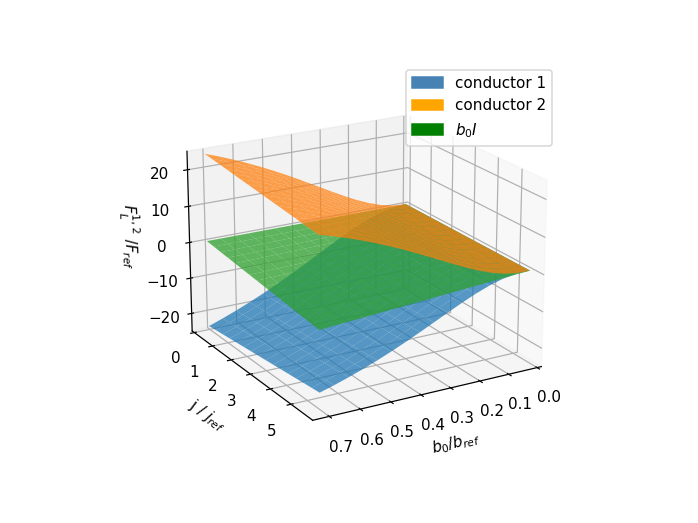

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<IPython.core.display.Javascript object>


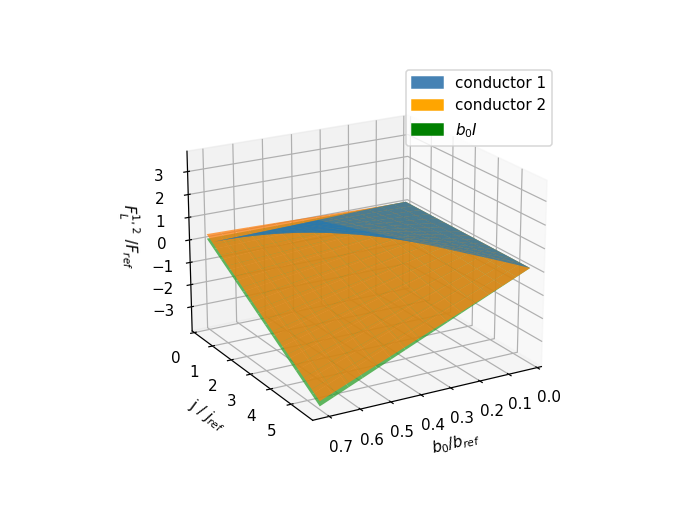

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<IPython.core.display.Javascript object>


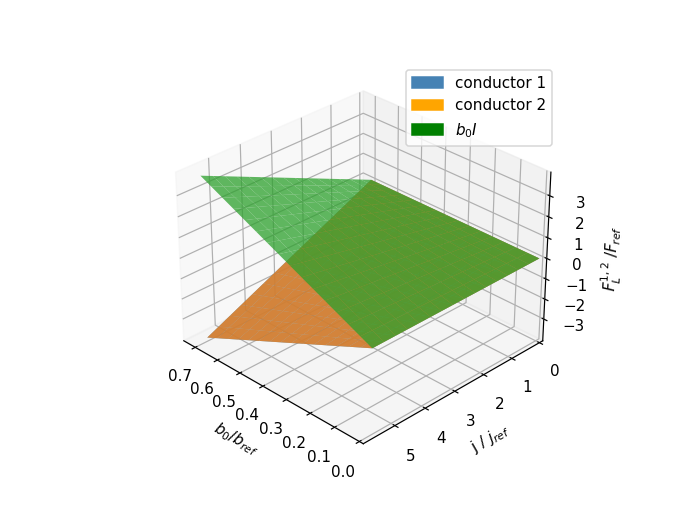

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<IPython.core.display.Javascript object>


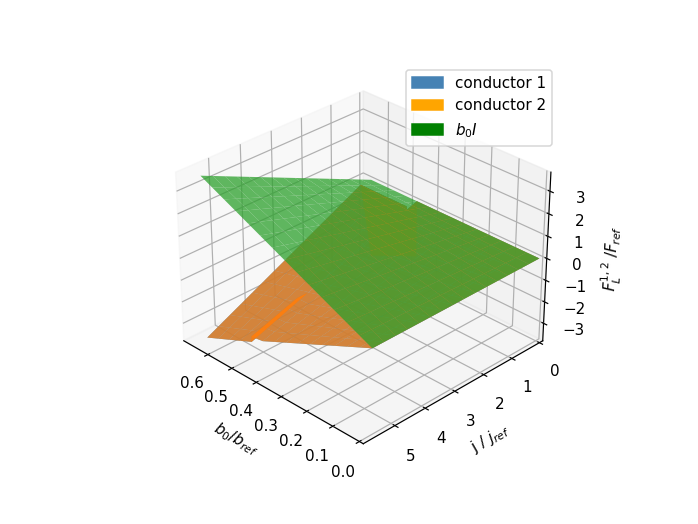

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


In [11]:
normalize=True

#FIG 3 :  2wires_alter bis

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_2wires_alter_bis.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/3D/2 wires with opposite current bis/'
title="2 wires with opposite current bis"
plot_data(0,data1redux,title,outputpath,0,0,20,0,0,60,normalize,2)
plot_data(16,data1redux,title,outputpath,0,0,20,0,0,60,normalize,2)

#FIG 3 : periodic_para

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_perio_para.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/3D/periodic wires with para current/'
title="periodic wires with parallel current"
plot_data(0,data1redux,title,outputpath,0,0,30,0,0,135,normalize,0)
plot_data(16,data1redux,title,outputpath,0,0,30,0,0,135,normalize,0)

<IPython.core.display.Javascript object>


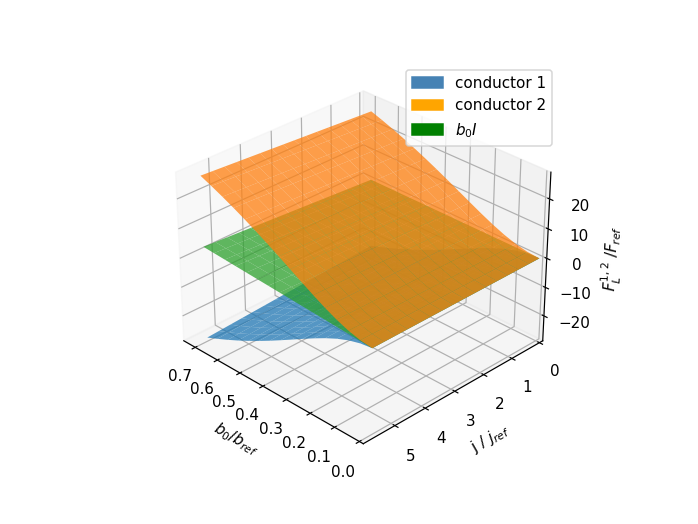

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<IPython.core.display.Javascript object>


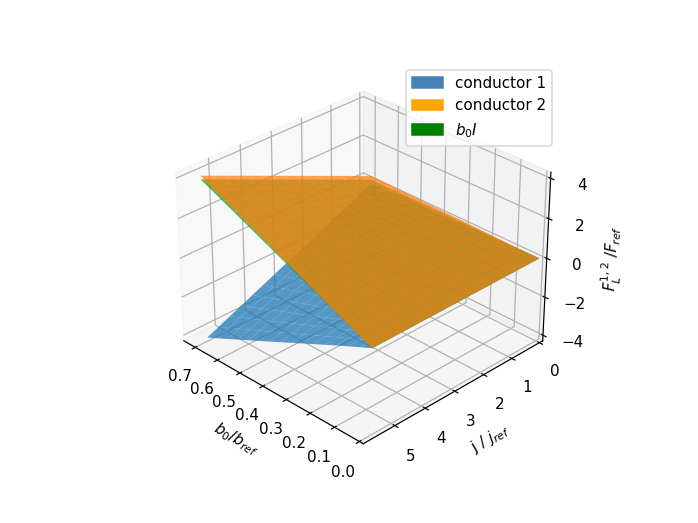

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<IPython.core.display.Javascript object>


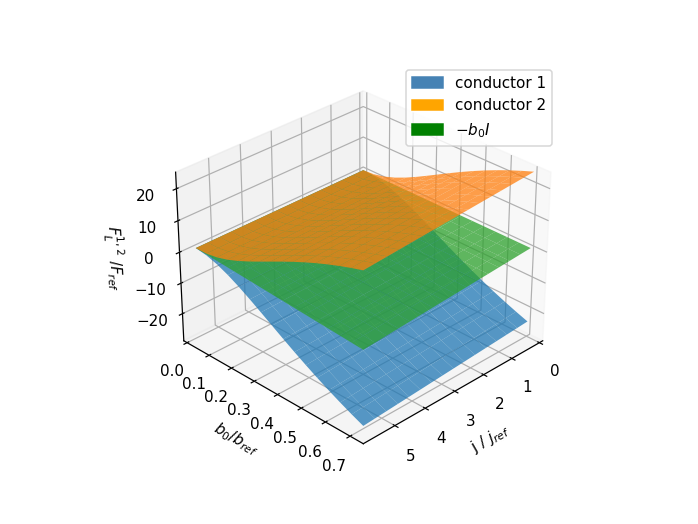

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<IPython.core.display.Javascript object>


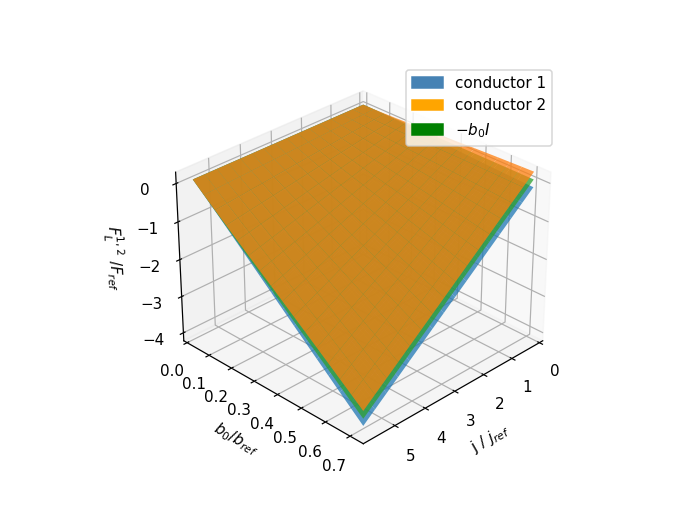

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<IPython.core.display.Javascript object>


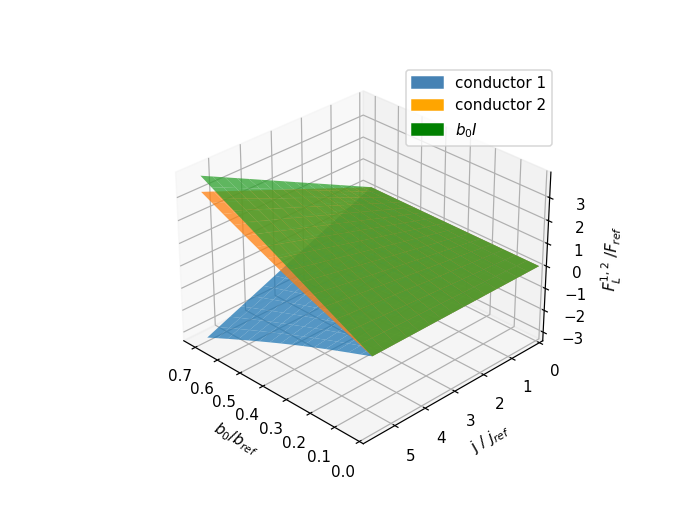

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<IPython.core.display.Javascript object>


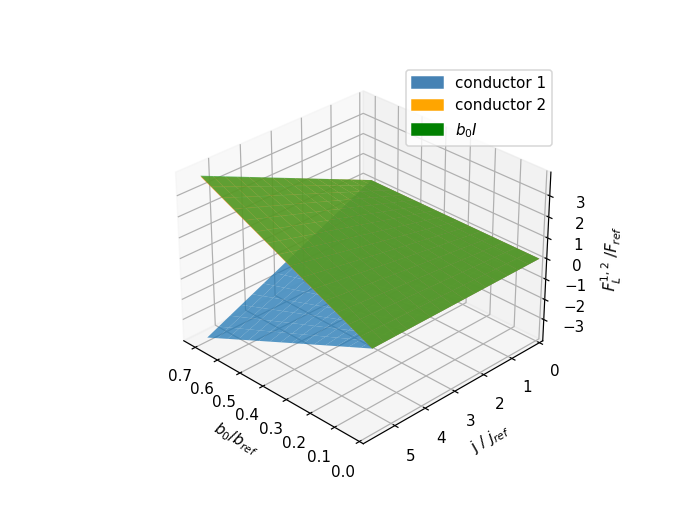

/tmp/ipykernel_7967/2929327527.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


In [12]:
normalize=True

#FIG 3 : 2wires_alter

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_2wires_alter.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/3D/2 wires with opposite current/'
title="2 wires with opposite current"
plot_data(0,data1redux,title,outputpath,0,0,30,0,0,135,normalize,0)
plot_data(16,data1redux,title,outputpath,0,0,30,0,0,135,normalize,0)

#FIG 3 : 2wires_para

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_2wires_para.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/3D/2 wires with para current/'
title="2 wires with parallel current"
plot_data(0,data1redux,title,outputpath,0,0,30,0,0,45,normalize,3)
plot_data(16,data1redux,title,outputpath,0,0,30,0,0,45,normalize,3)

#FIG 3 : periodic_alter

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_perio_alter.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/3D/periodic wires with opposite current/'
title="2 wires with opposite current"
plot_data(0,data1redux,title,outputpath,0,0,30,0,0,135,normalize,0)
plot_data(16,data1redux,title,outputpath,0,0,30,0,0,135,normalize,0)



In [5]:
def plot_slices(data1redux,outputpath,current_density_list,b0_list,test1):
    for i in range(len(current_density_list)):
        datalocal=data1redux[data1redux['current density']==current_density_list[i]]
        datalocal=datalocal[['size multiplicator ','integral_force','integral_force2','magnetic field']]
        datalocal['d/r']=datalocal['size multiplicator ']+4
        datalocal['b/bref']=datalocal['magnetic field']/bref
        datalocal['f/fref']=datalocal['integral_force']/fref
        datalocal['f2/fref']=datalocal['integral_force2']/fref
        ax=datalocal.pivot_table(index='b/bref',columns='d/r',values='f2/fref').plot(colormap=colormap_general)
        ax.legend(loc='lower left',title="D/R")
        datalocal.pivot_table(index='b/bref',columns='d/r',values='f/fref').plot(ax=ax,style='--',legend=False,colormap=colormap_general)
        if(print_title):
            plt.title("periodic wires with opposite current, j="+str(current_density_list[i])+" A/m²")
        plt.xlabel("$b_0 / b_{ref}$")
        plt.ylabel("$F_L^{1,2}$ /$F_{ref}$")
        if(current_density_list[i]==169630 and test1==1):
            ax.set_ylim(-30,30)
        if(current_density_list[i]==2544440 and test1==2):
            ax.set_ylim(-25,25)
        plt.savefig(outputpath+'j='+str(current_density_list[i])+' both wire.pdf')  

    for i in range(len(b0_list)):
        datalocal=data1redux[data1redux['magnetic field']==b0_list[i]]
        datalocal=datalocal[['size multiplicator ','integral_force','integral_force2','current density']]
        datalocal['d/r']=datalocal['size multiplicator ']+4
        datalocal['j/jref']=datalocal['current density']/jref
        datalocal['f/fref']=datalocal['integral_force']/fref
        datalocal['f2/fref']=datalocal['integral_force2']/fref
        ax=datalocal.pivot_table(index='j/jref',columns='d/r',values='f2/fref').plot(colormap=colormap_general)
        #handles, labels = ax.get_legend_handles_labels()
        #ax.legend(handles=handles,loc='lower left',title="D/R")
        
        ax.legend(loc='lower left',title="D/R")
        
        datalocal.pivot_table(index='j/jref',columns='d/r',values='f/fref').plot(ax=ax,style='--',legend=False,colormap=colormap_general)
        if(print_title):
            plt.title("periodic wires with opposite current, b0="+str(b0_list[i])+" T")
        plt.xlabel("j / $j_{ref}$")
        plt.ylabel("$F_L^{1,2}$ /$F_{ref}$")
        
        plt.savefig(outputpath+'b0='+str(b0_list[i])+' both wire.pdf')  

<IPython.core.display.Javascript object>


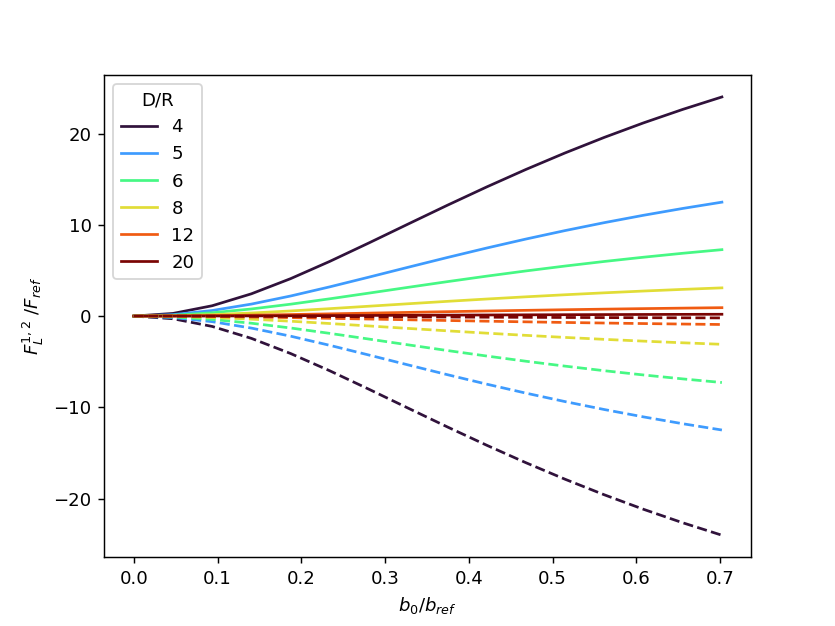

<IPython.core.display.Javascript object>


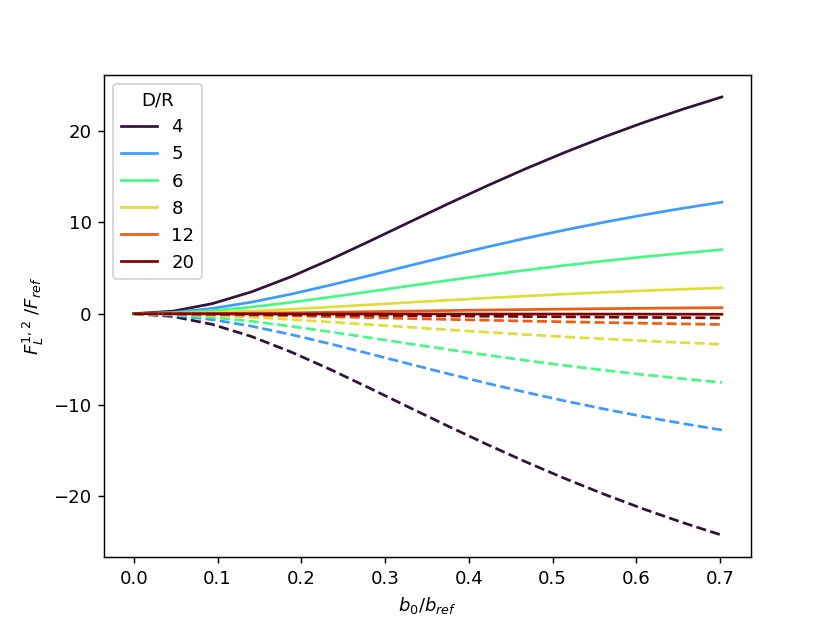

<IPython.core.display.Javascript object>


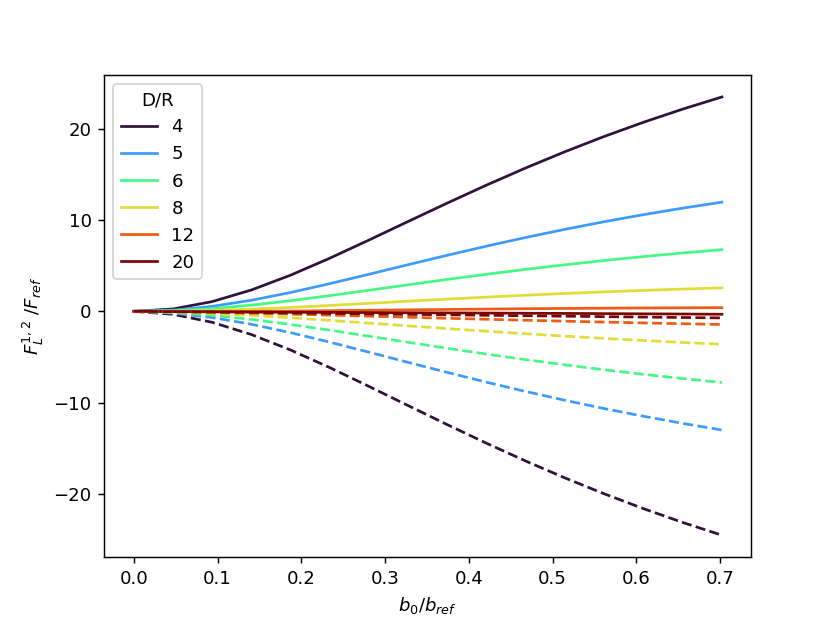

<IPython.core.display.Javascript object>


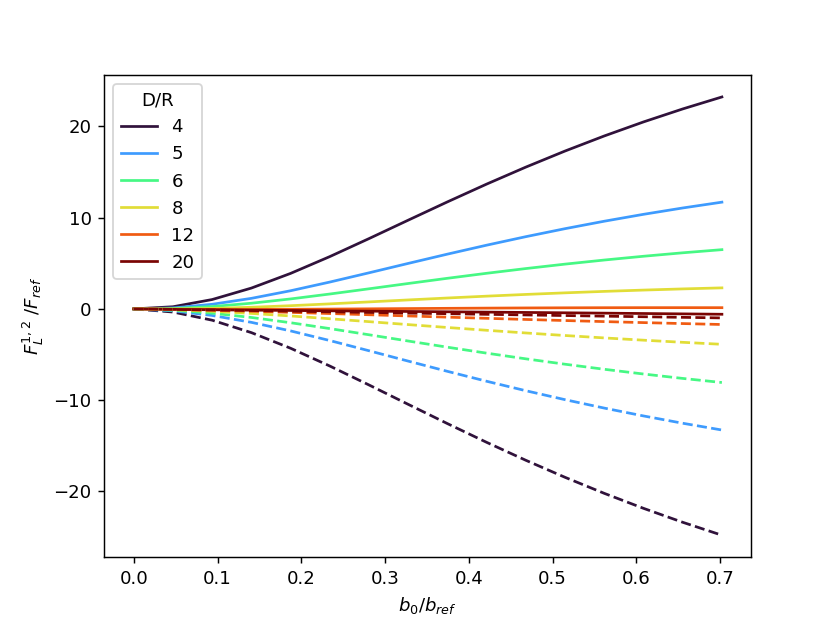

<IPython.core.display.Javascript object>


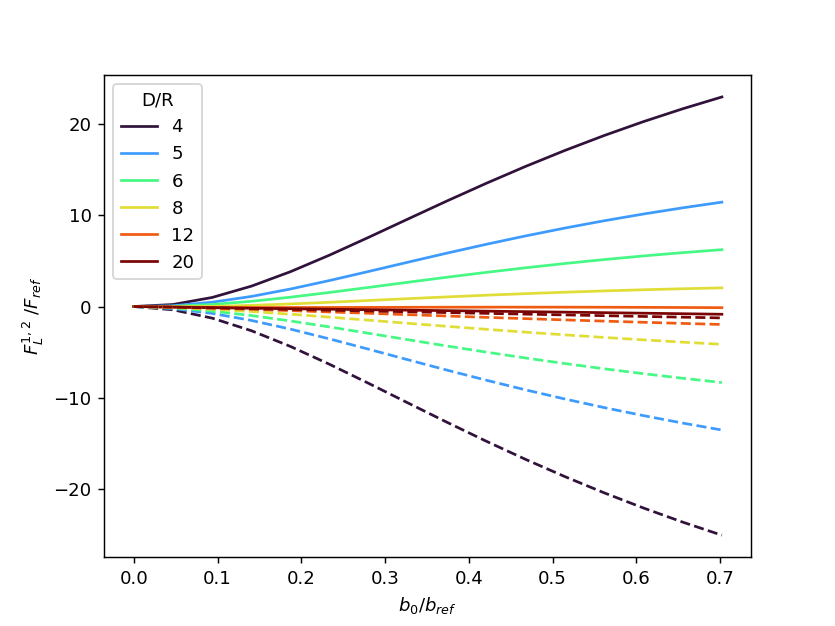

<IPython.core.display.Javascript object>


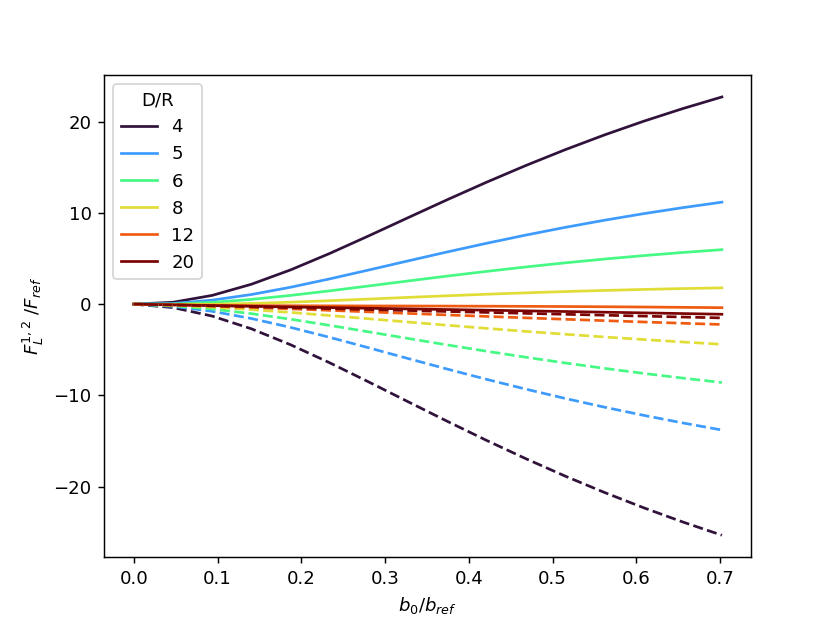

<IPython.core.display.Javascript object>


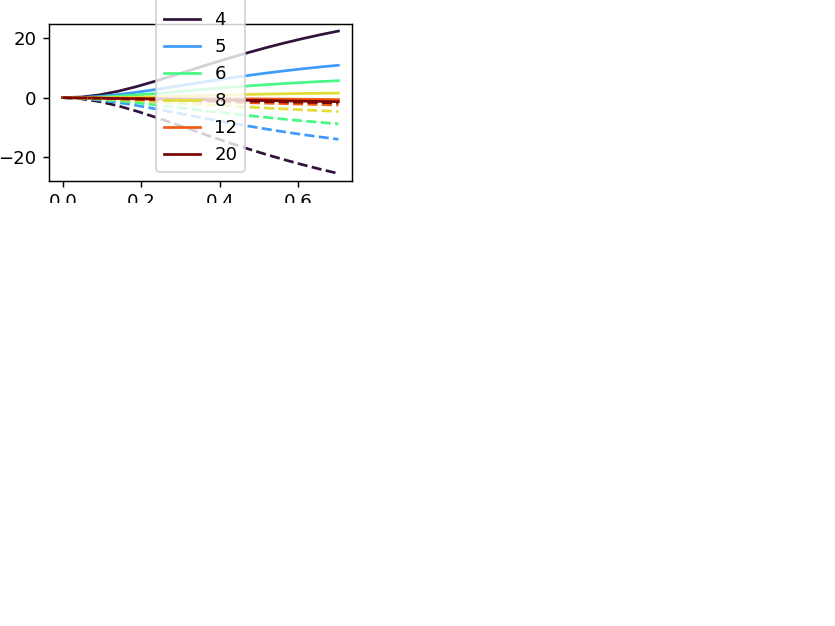

<IPython.core.display.Javascript object>


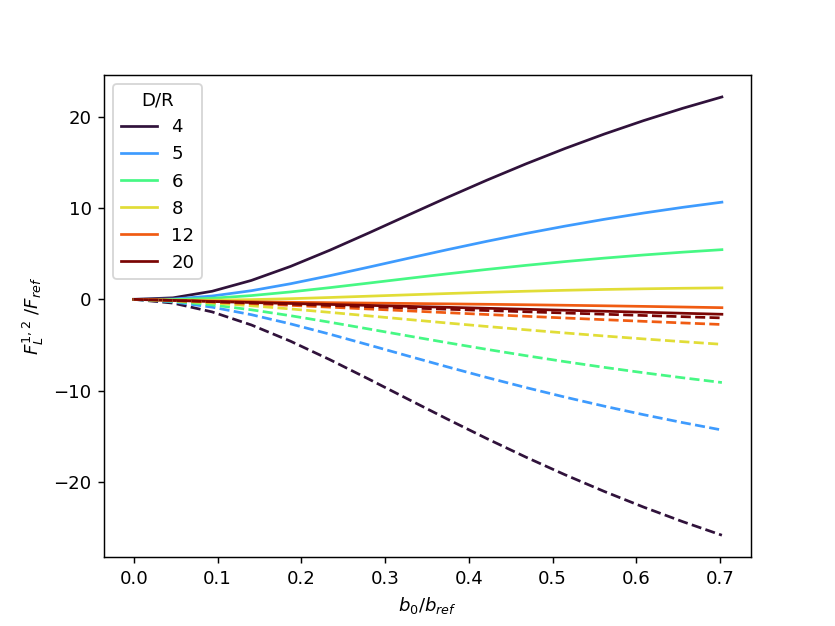

<IPython.core.display.Javascript object>


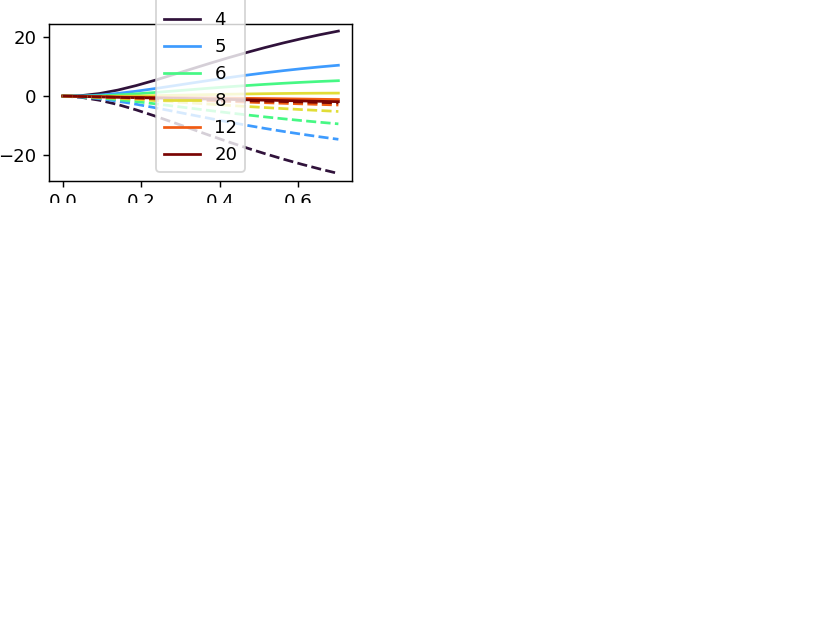

<IPython.core.display.Javascript object>


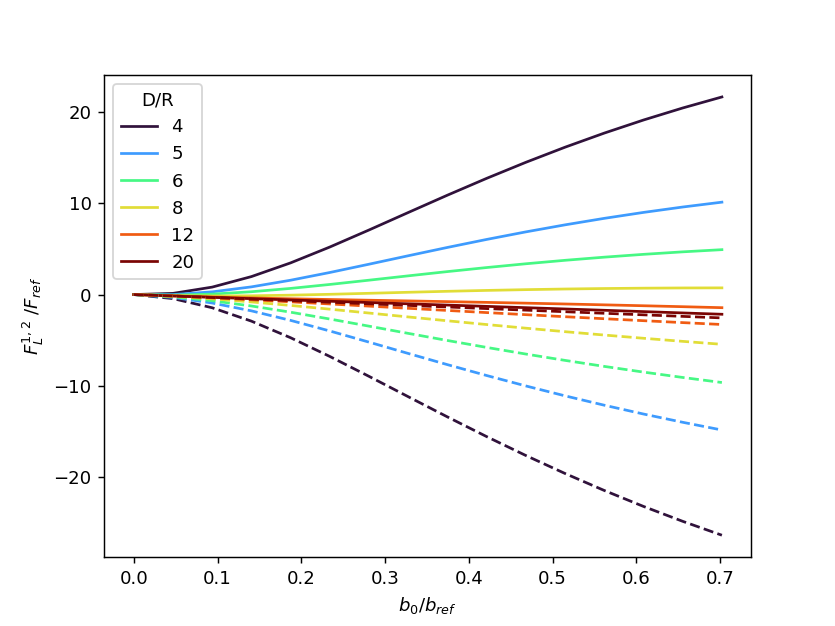

/home/magda/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


<IPython.core.display.Javascript object>


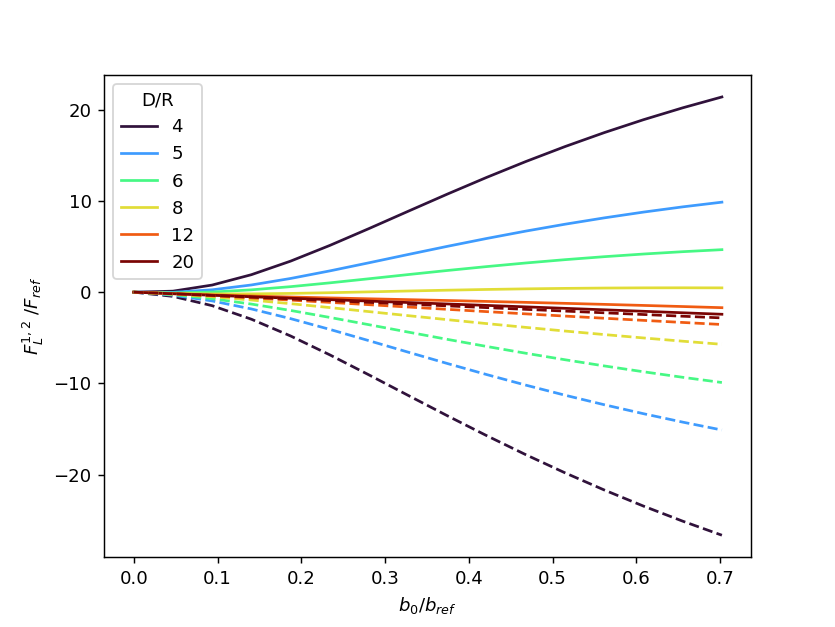

<IPython.core.display.Javascript object>


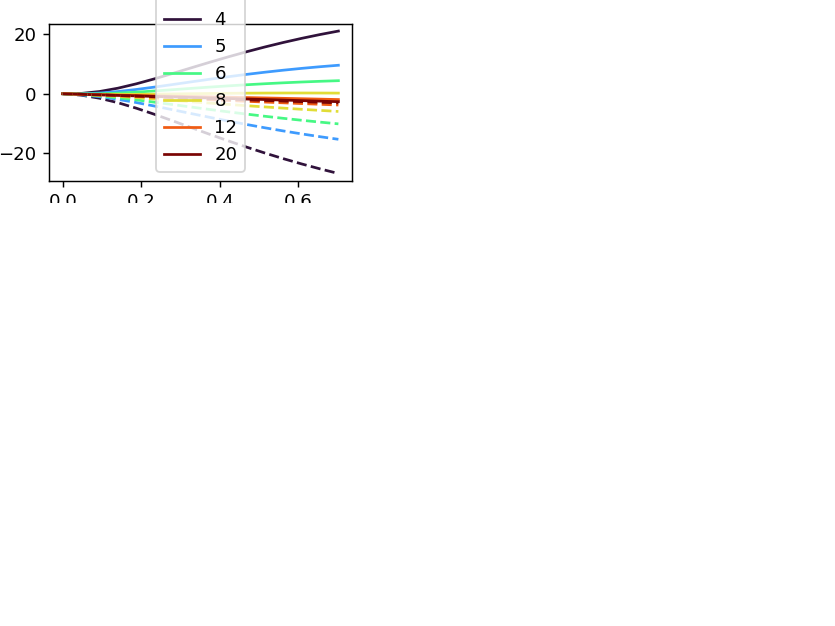

<IPython.core.display.Javascript object>


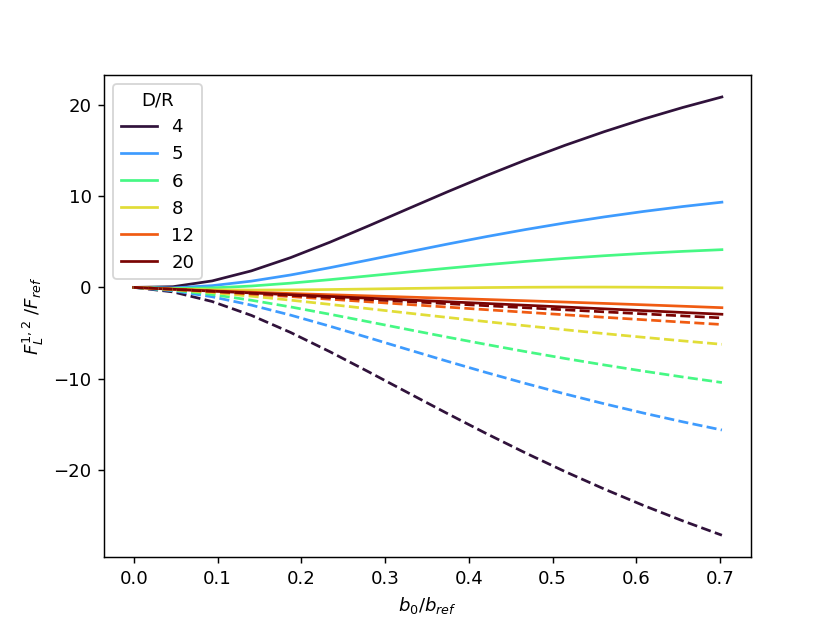

<IPython.core.display.Javascript object>


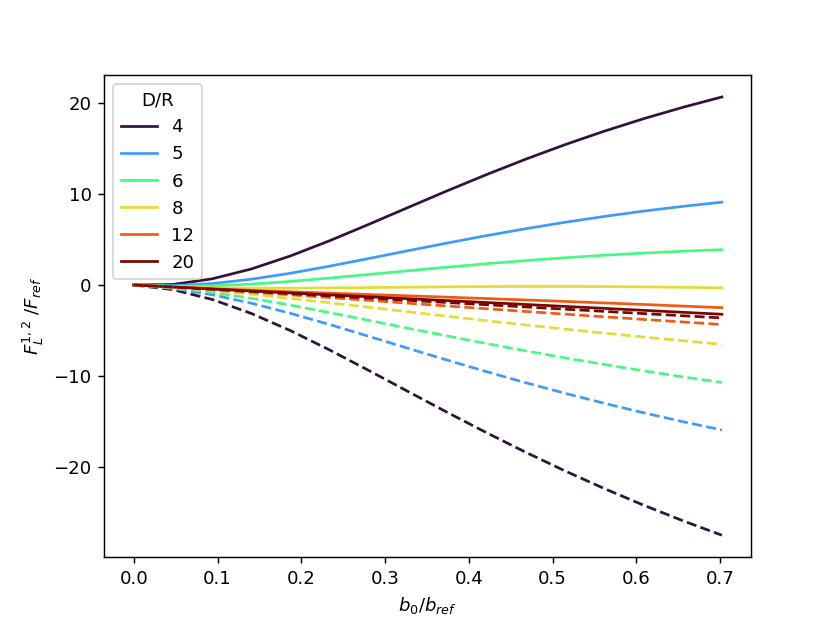

<IPython.core.display.Javascript object>


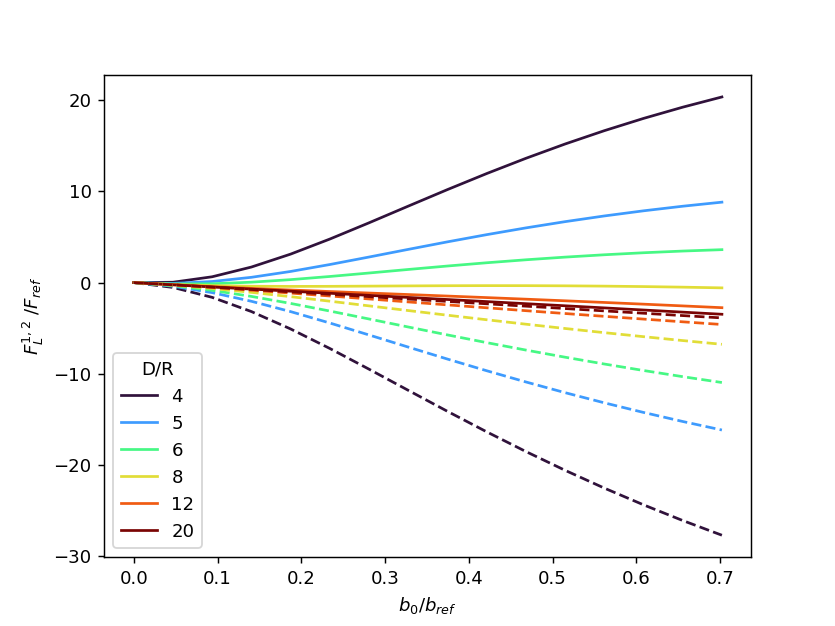

<IPython.core.display.Javascript object>


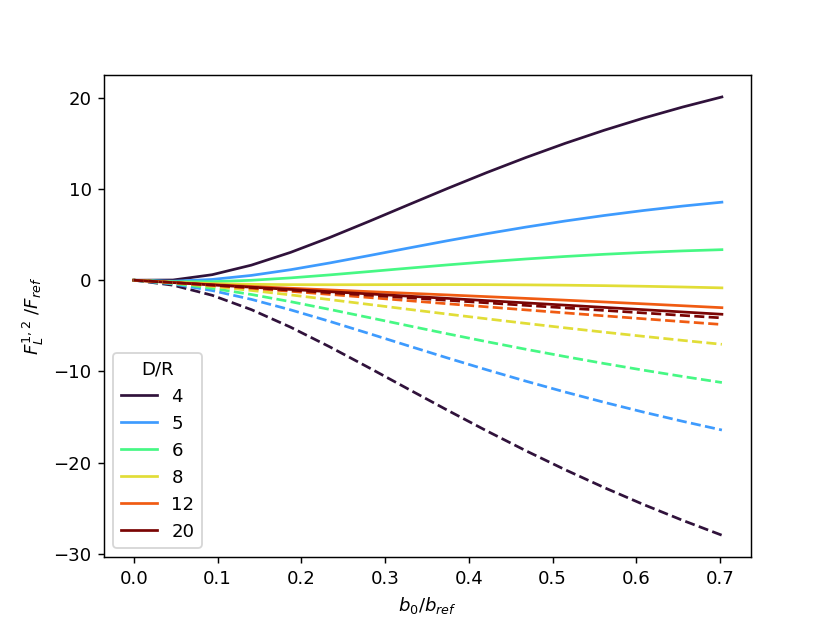

<IPython.core.display.Javascript object>


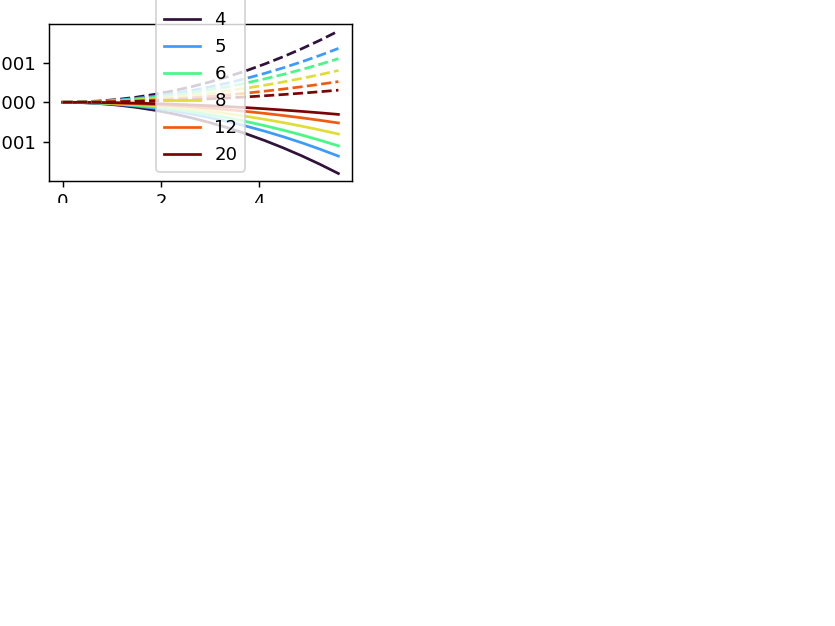

<IPython.core.display.Javascript object>


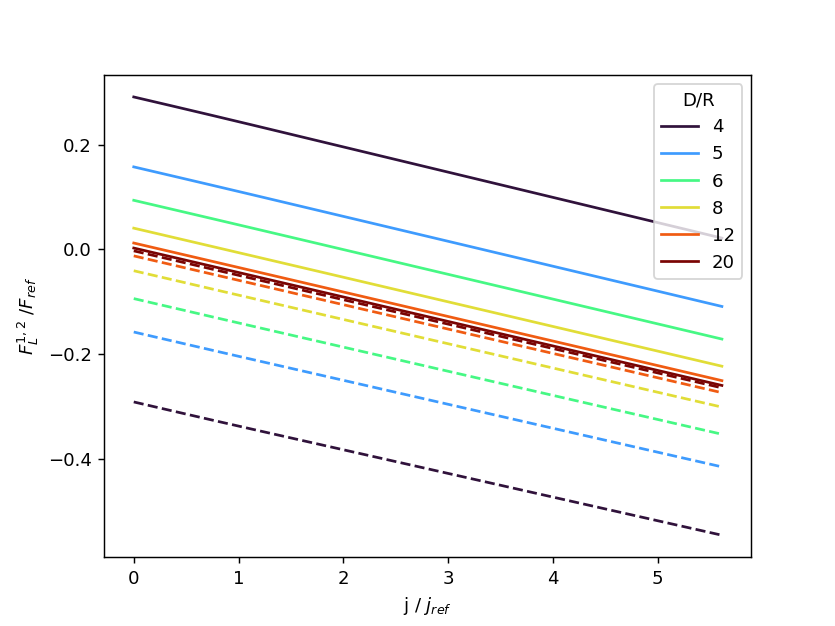

<IPython.core.display.Javascript object>


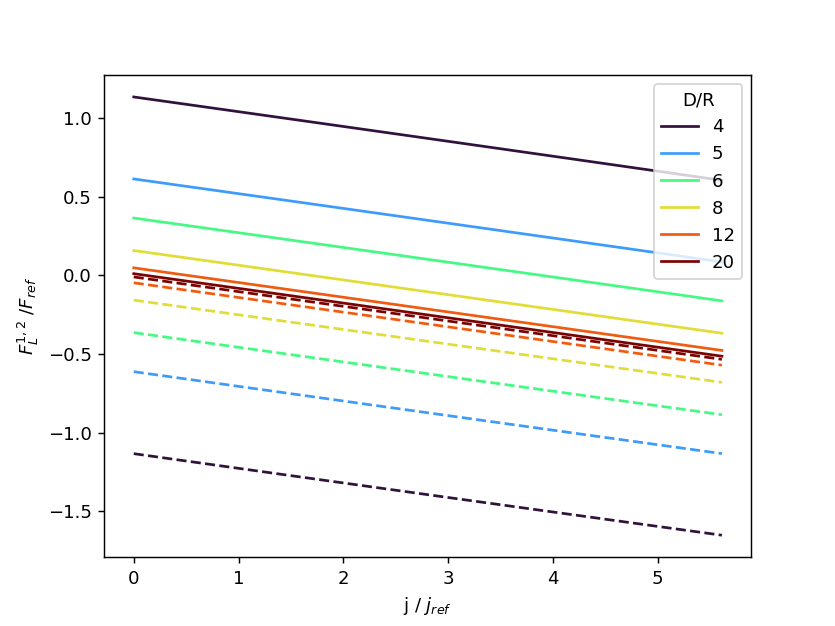

<IPython.core.display.Javascript object>


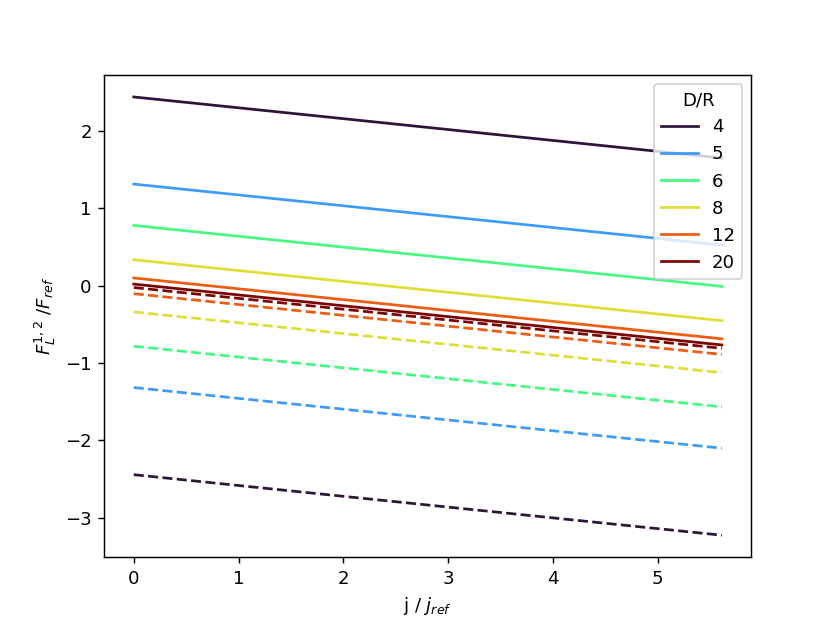

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


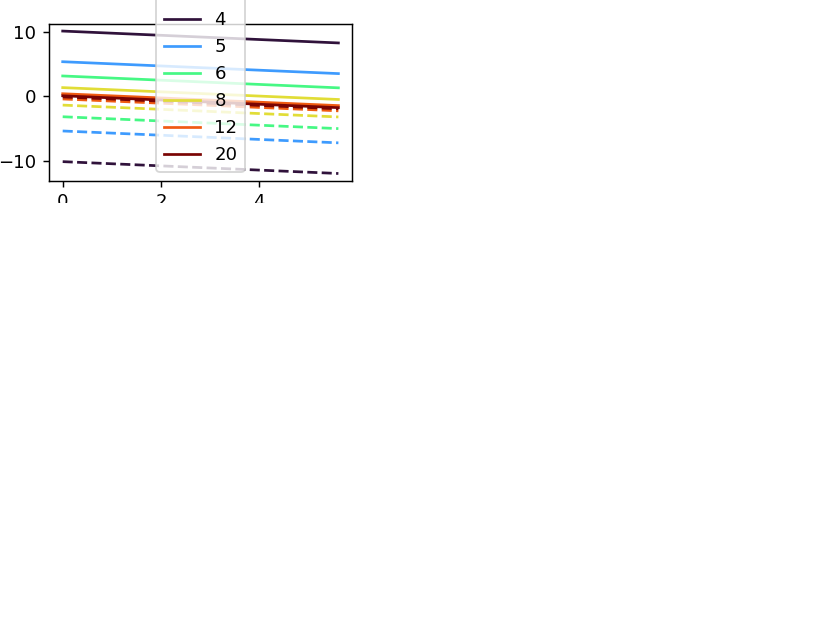

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


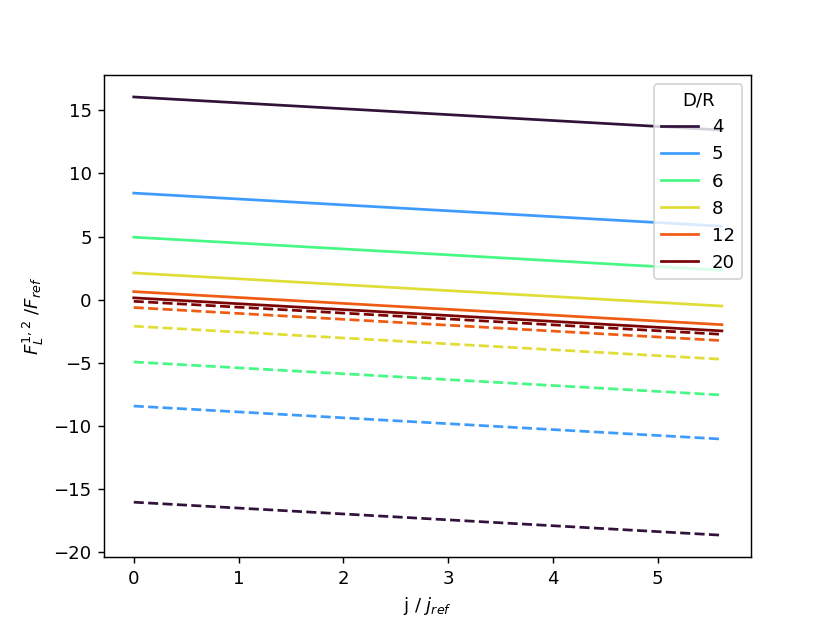

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


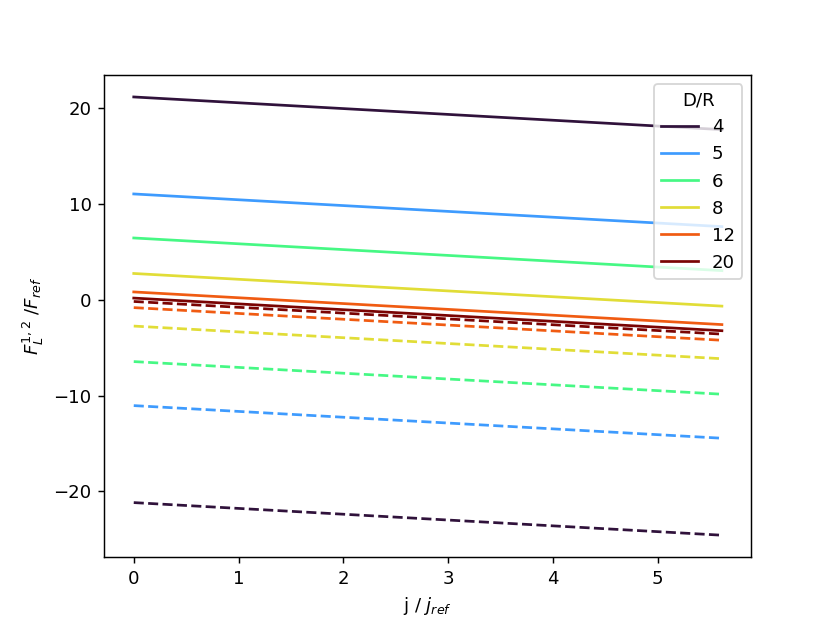

<IPython.core.display.Javascript object>


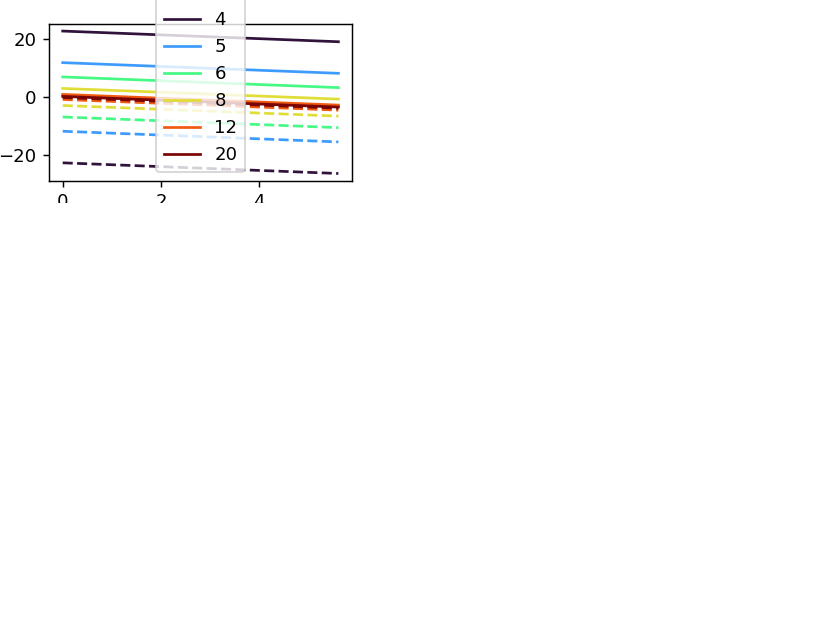

<IPython.core.display.Javascript object>


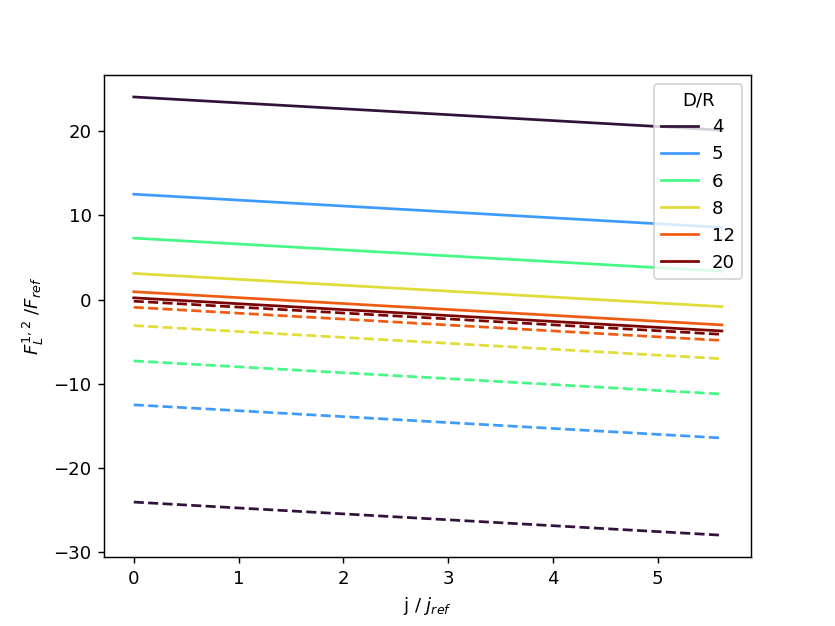

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


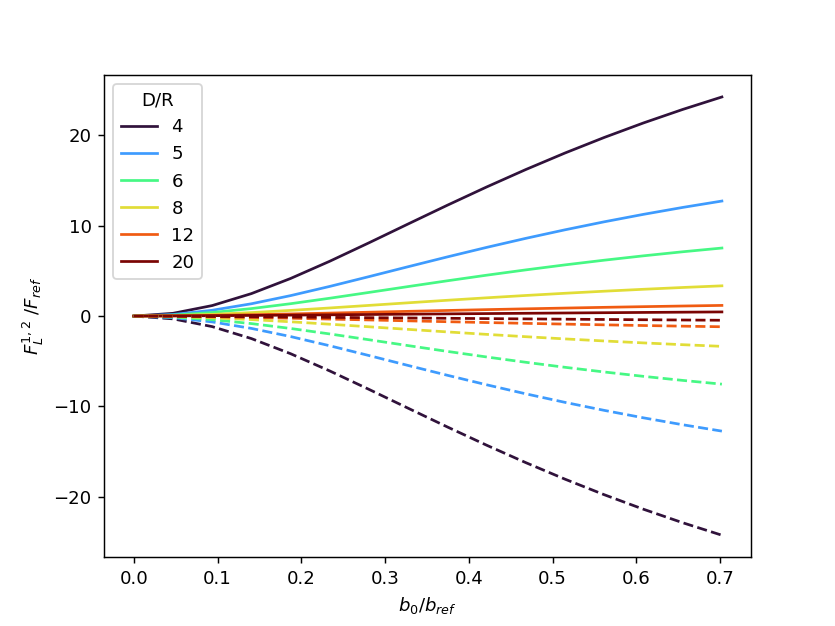

<IPython.core.display.Javascript object>


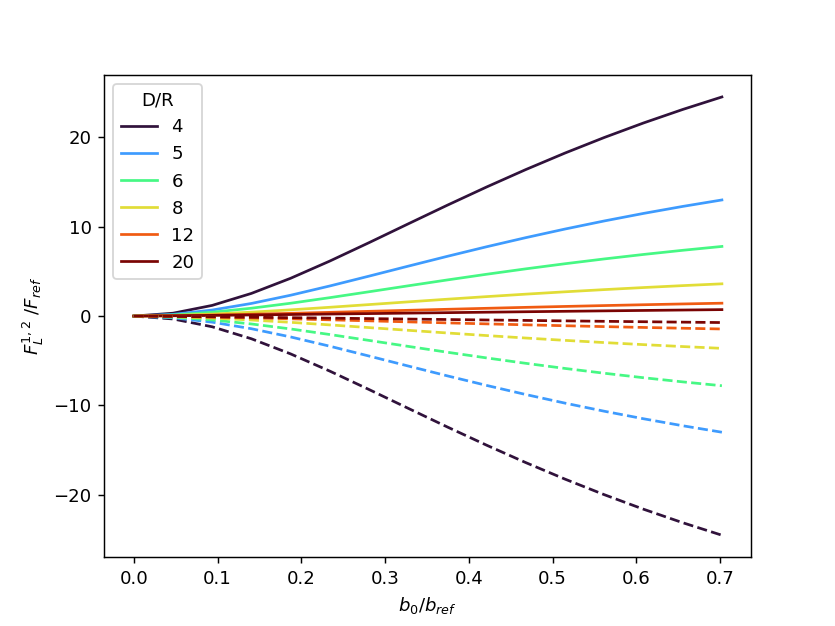

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


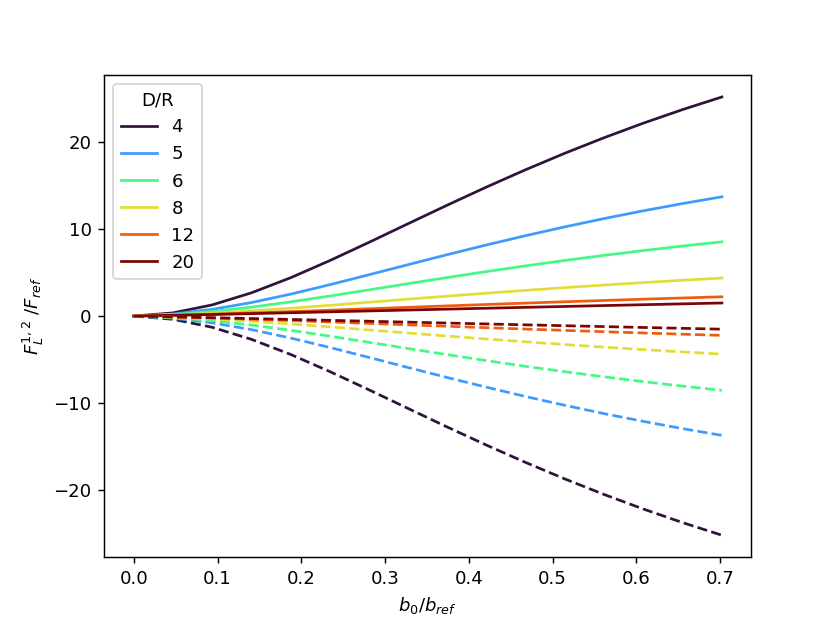

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


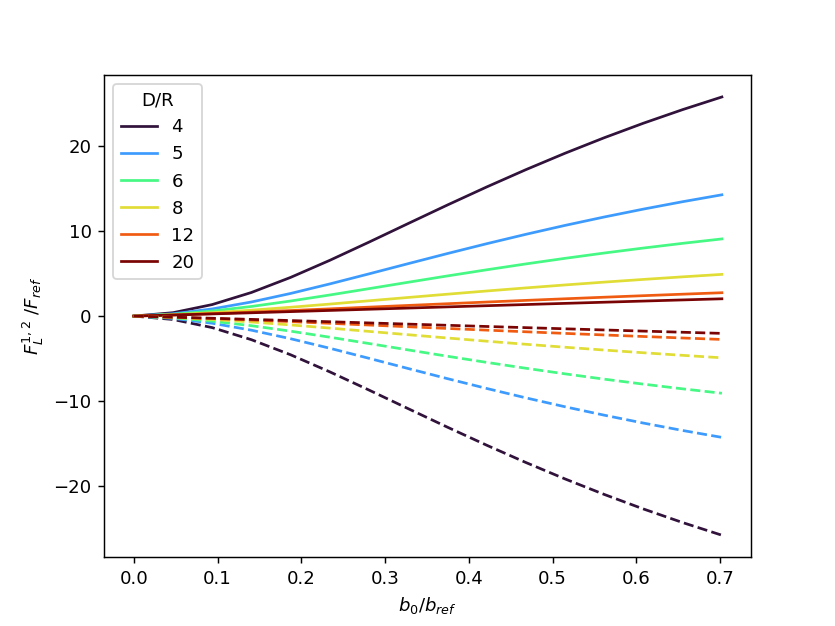

<IPython.core.display.Javascript object>


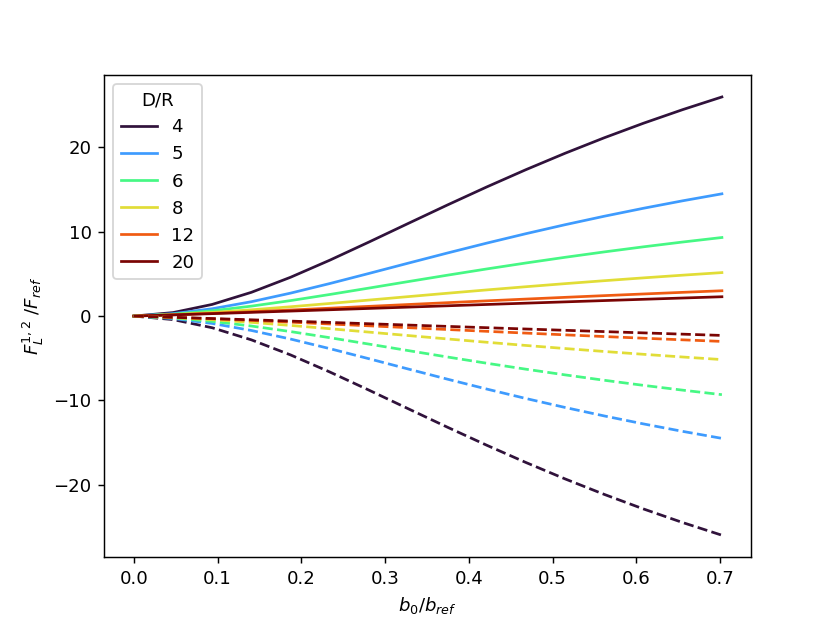

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


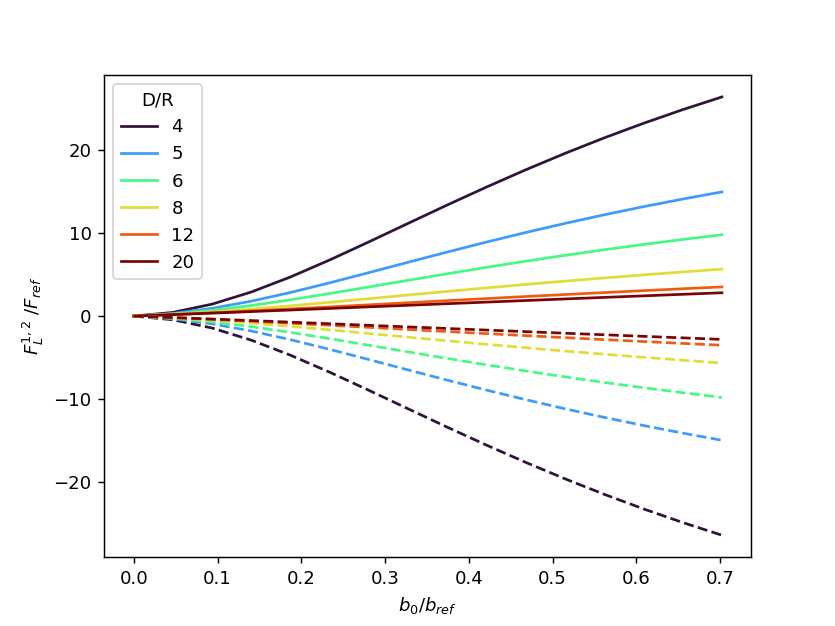

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


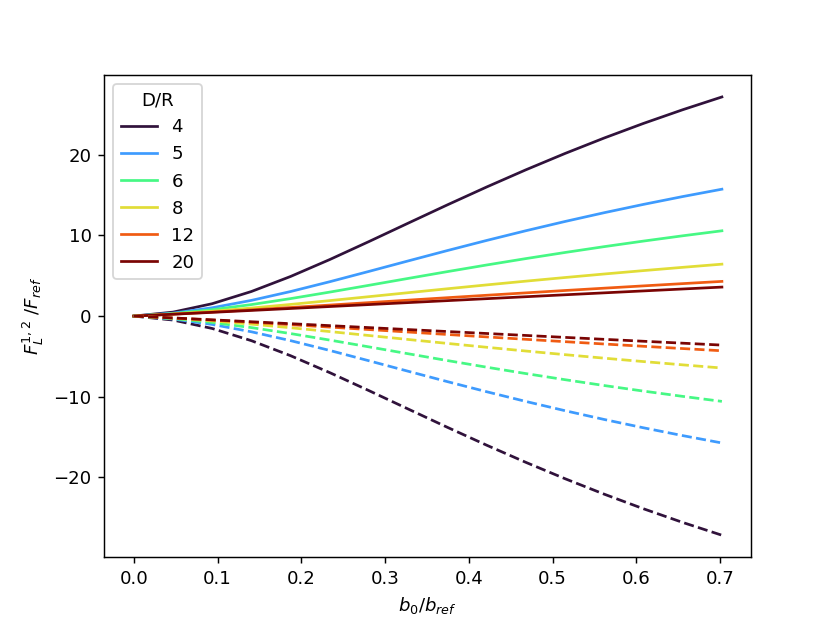

<IPython.core.display.Javascript object>


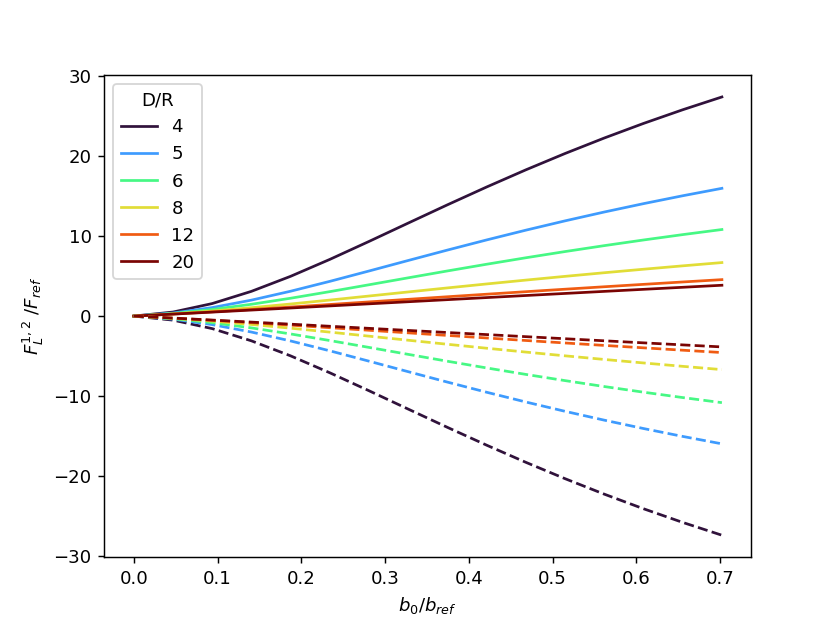

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


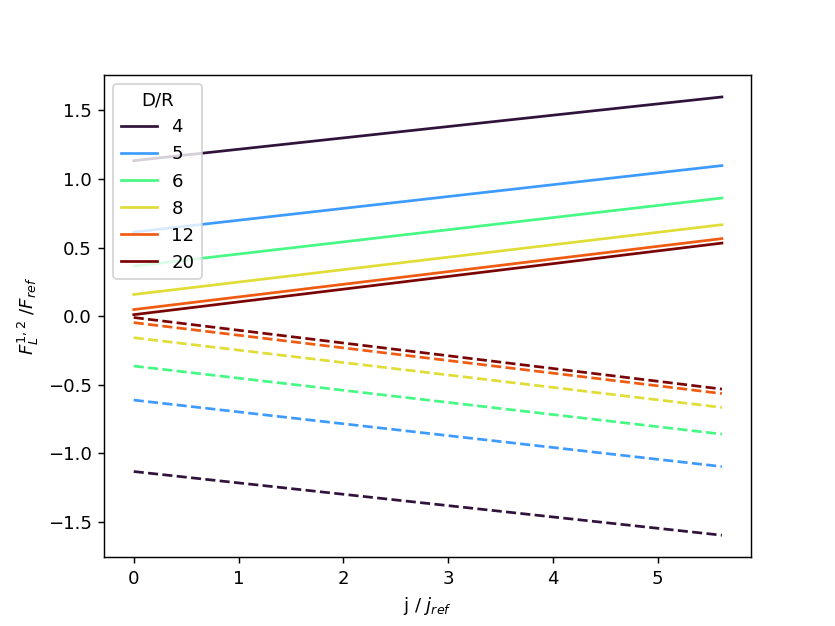

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


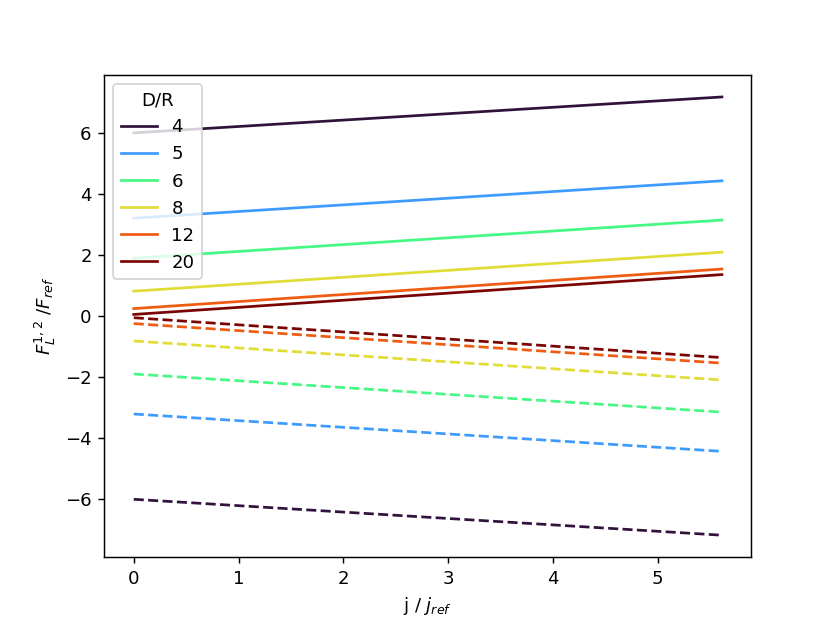

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


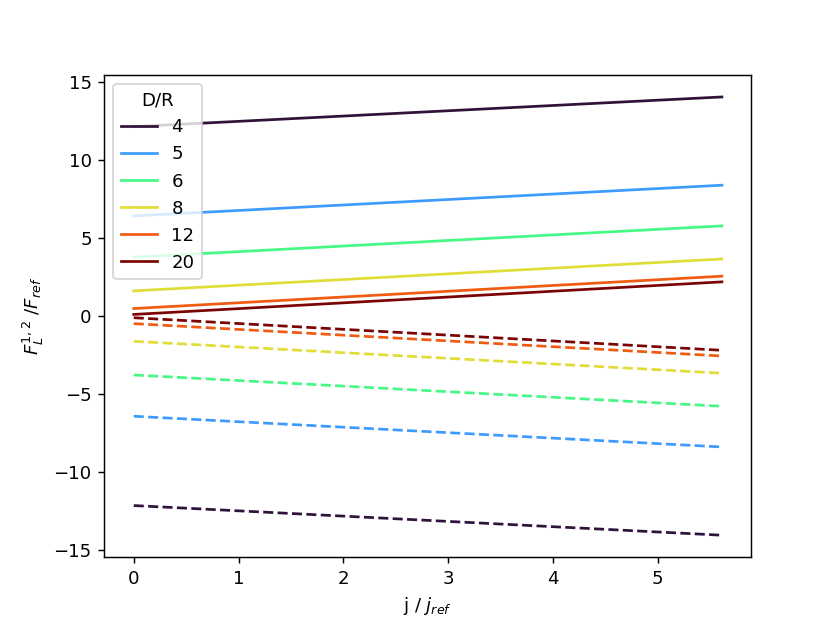

<IPython.core.display.Javascript object>


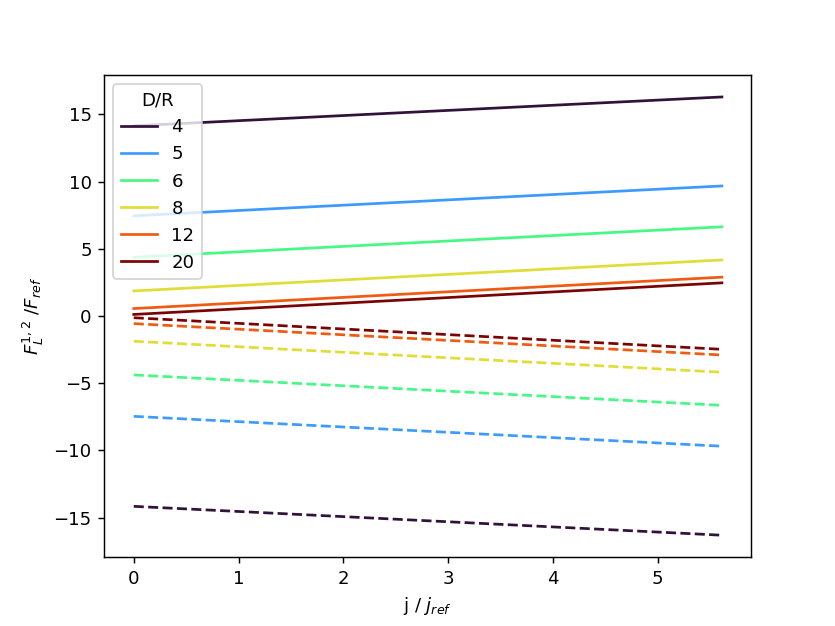

<IPython.core.display.Javascript object>


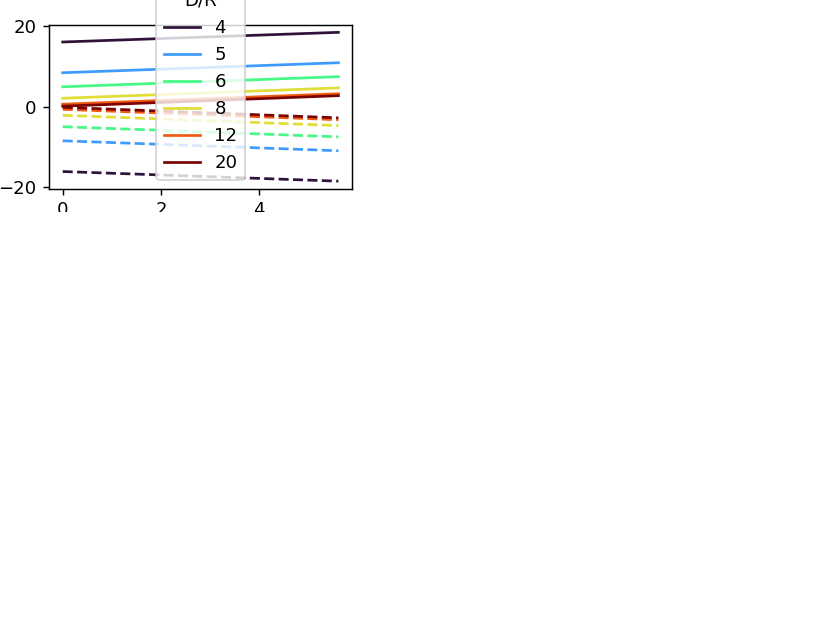

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


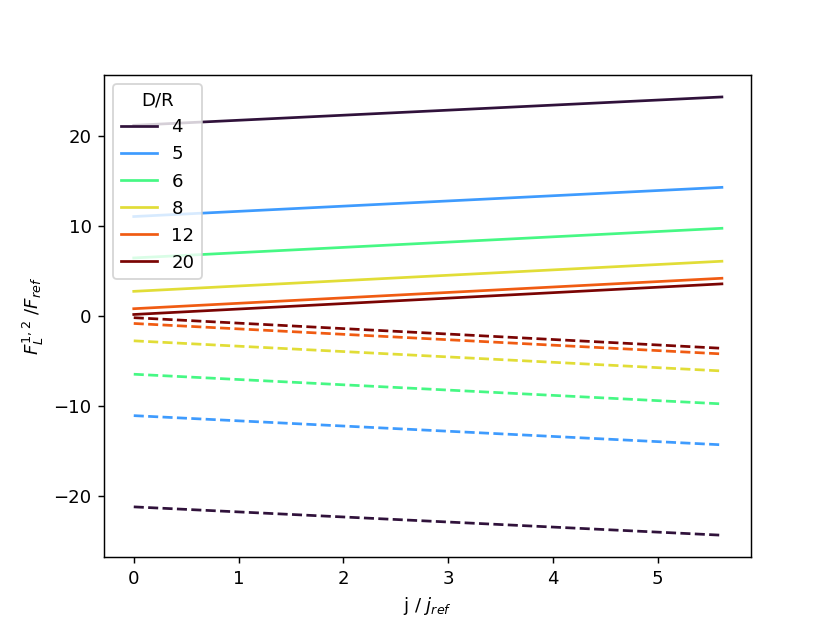

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


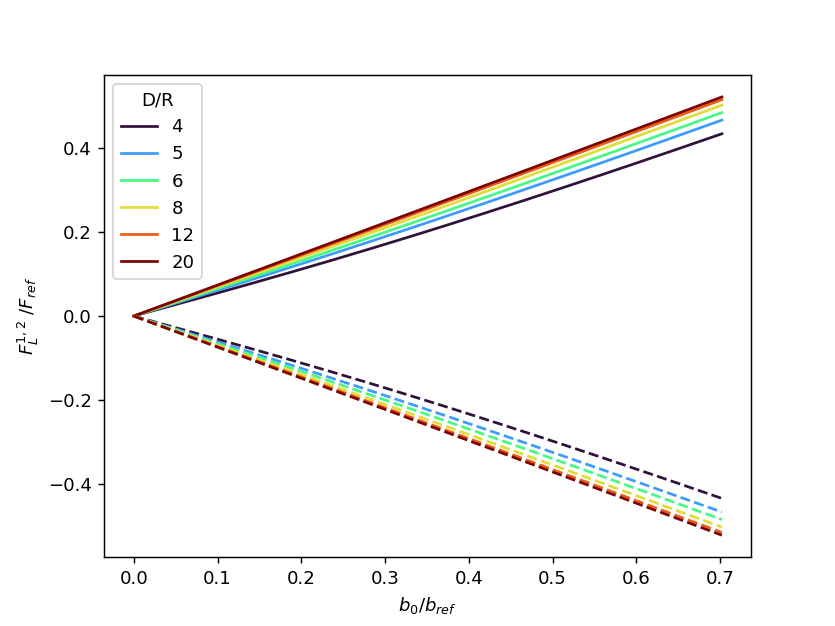

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


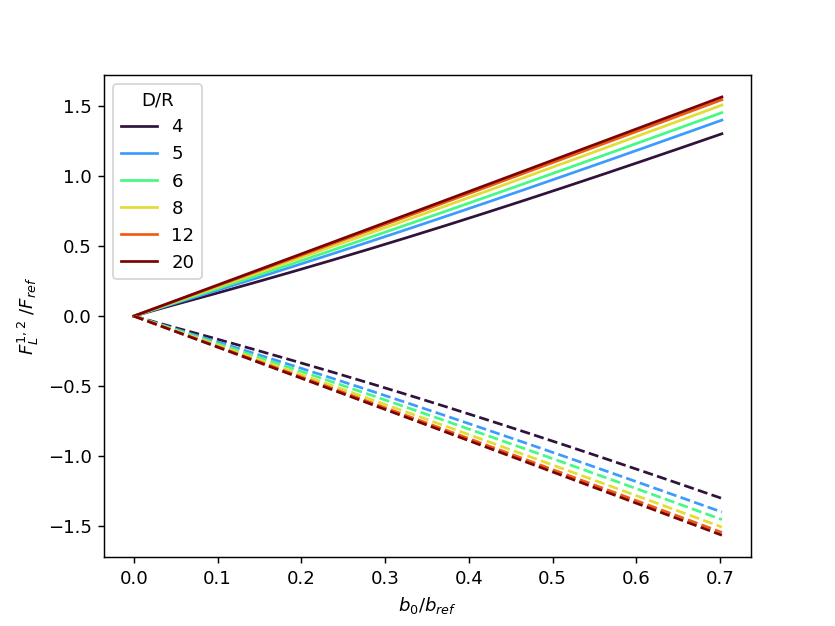

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


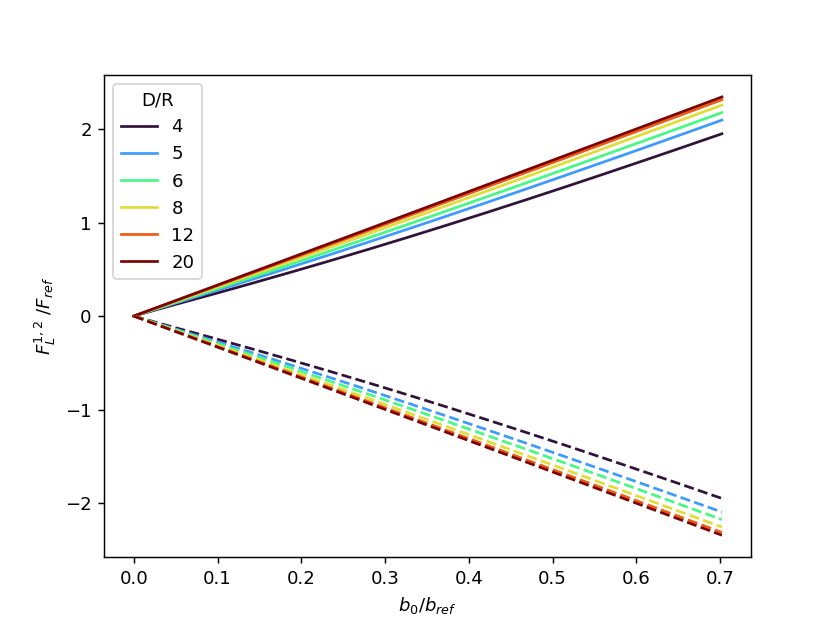

<IPython.core.display.Javascript object>


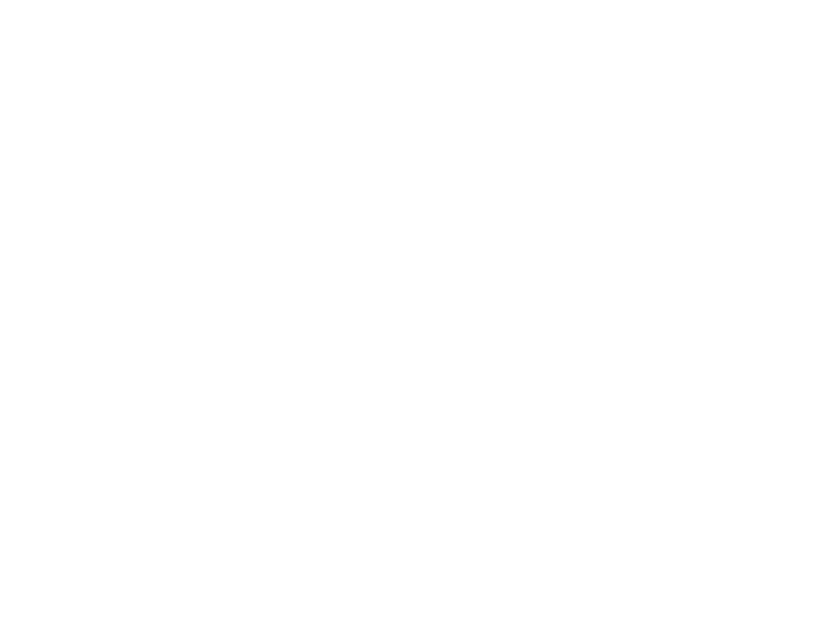

<IPython.core.display.Javascript object>


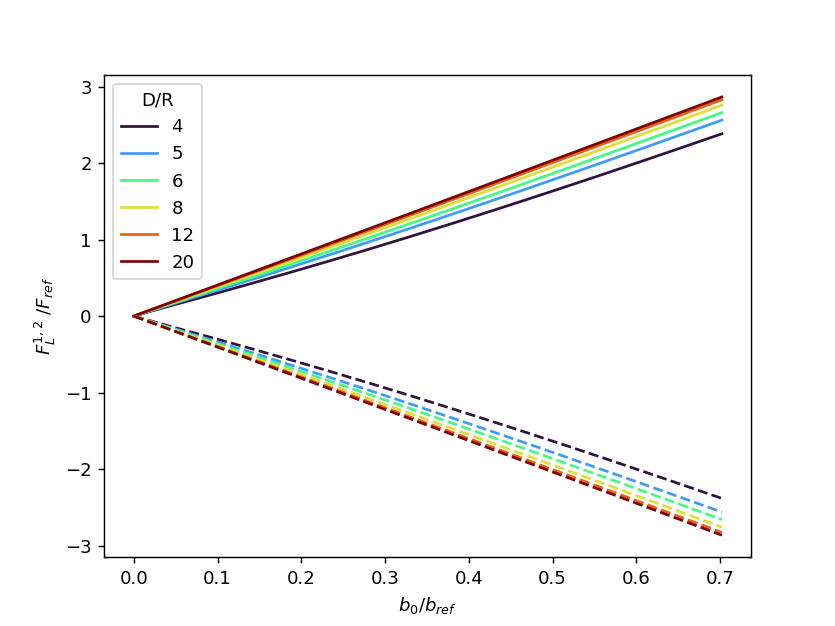

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


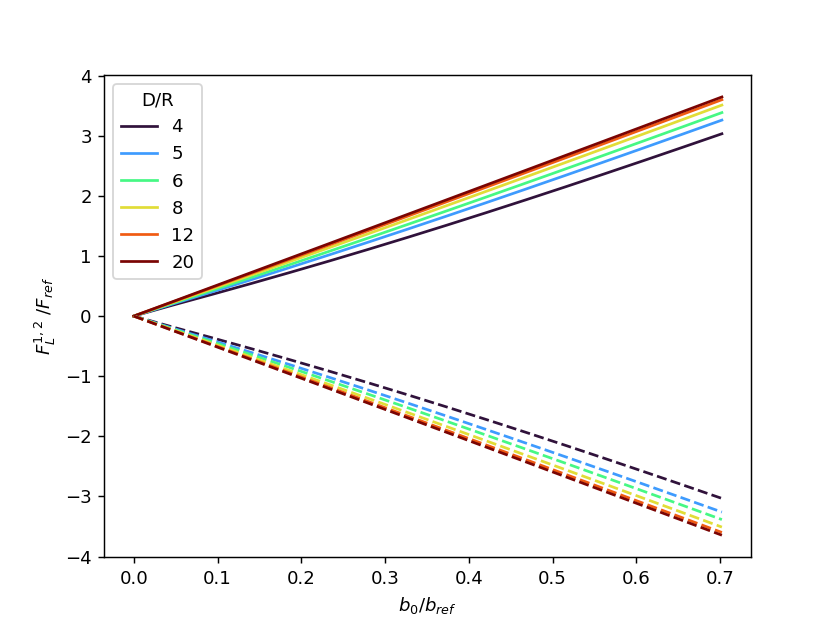

<IPython.core.display.Javascript object>


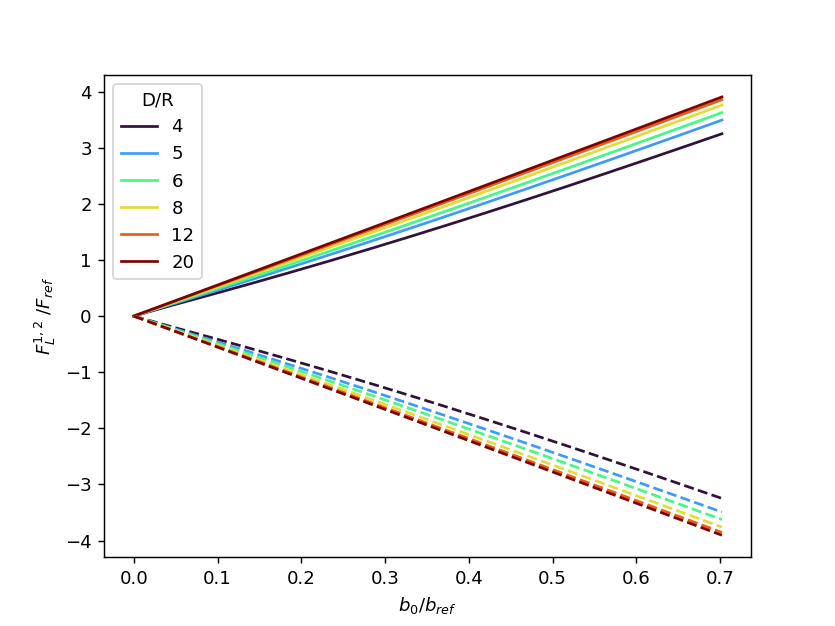

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


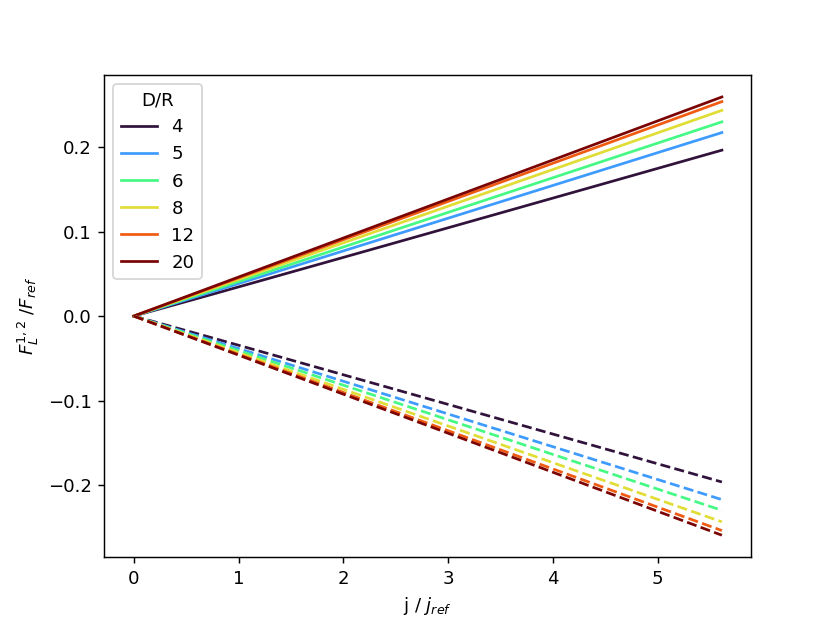

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


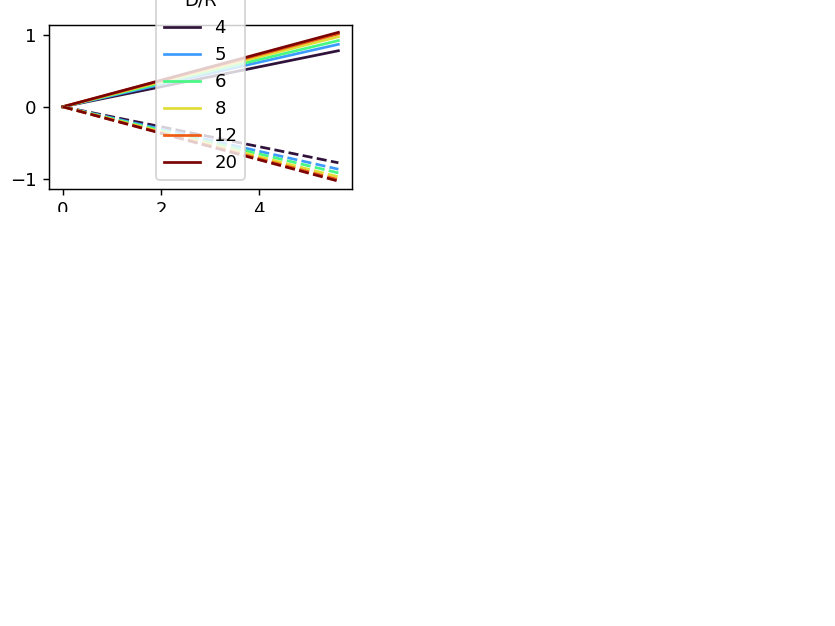

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


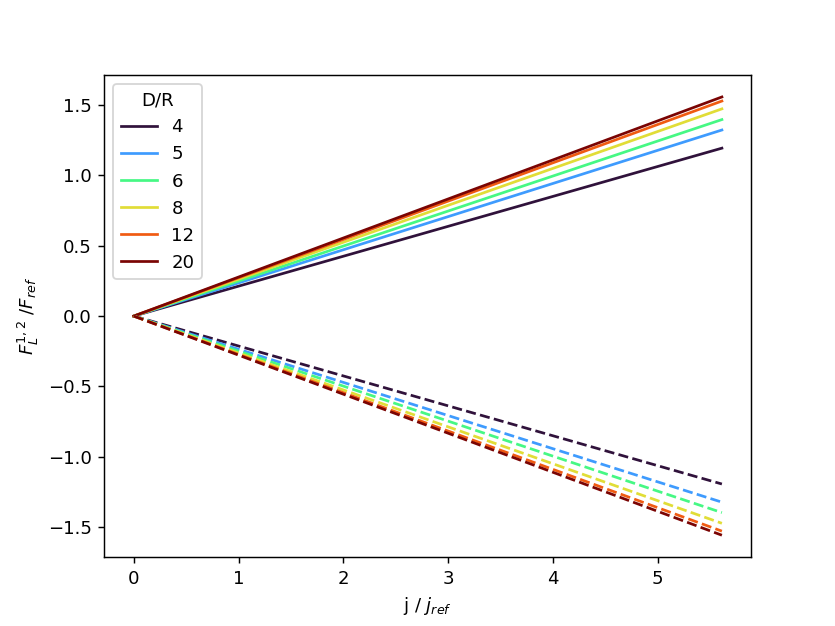

<IPython.core.display.Javascript object>


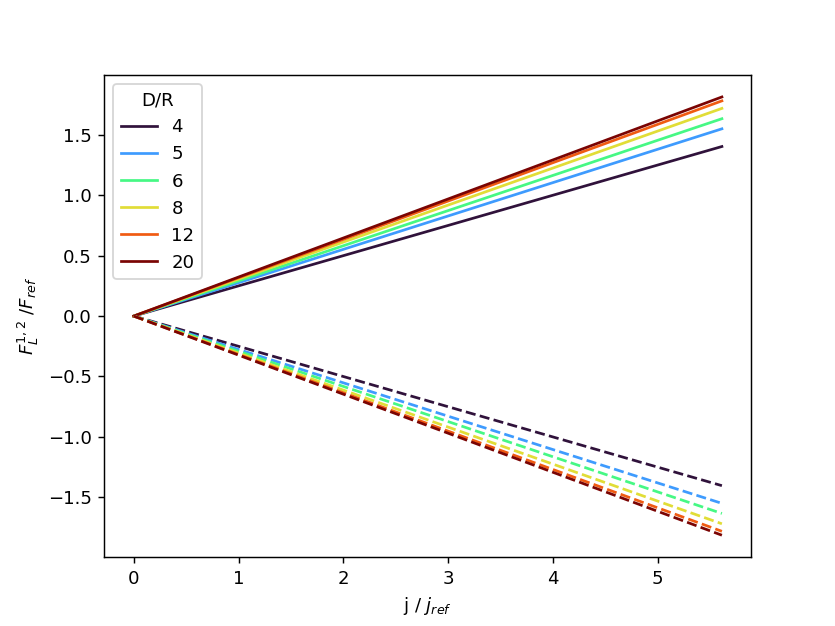

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


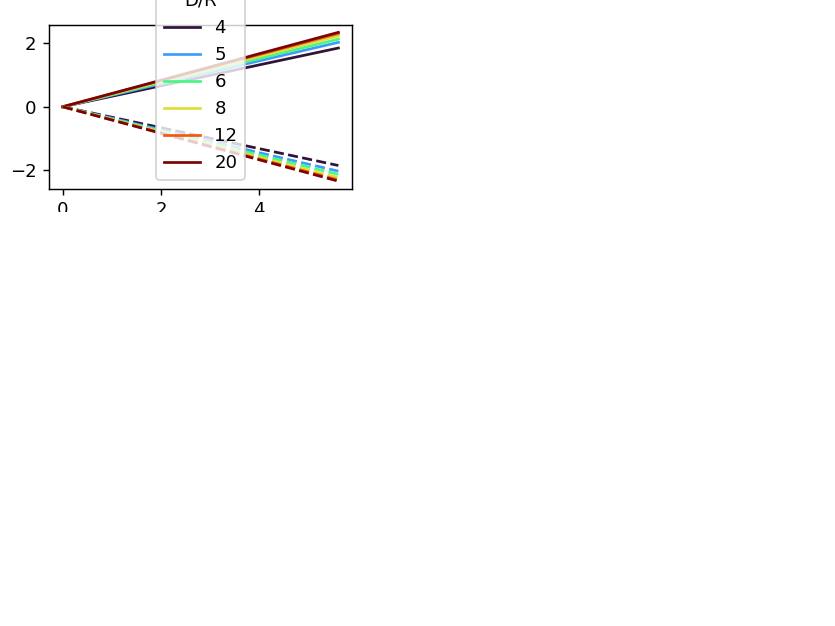

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


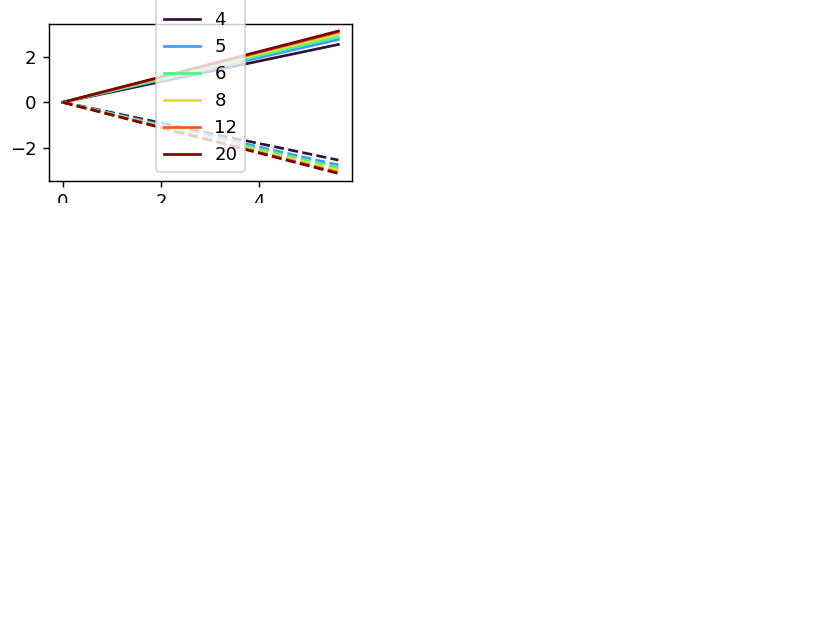

<IPython.core.display.Javascript object>


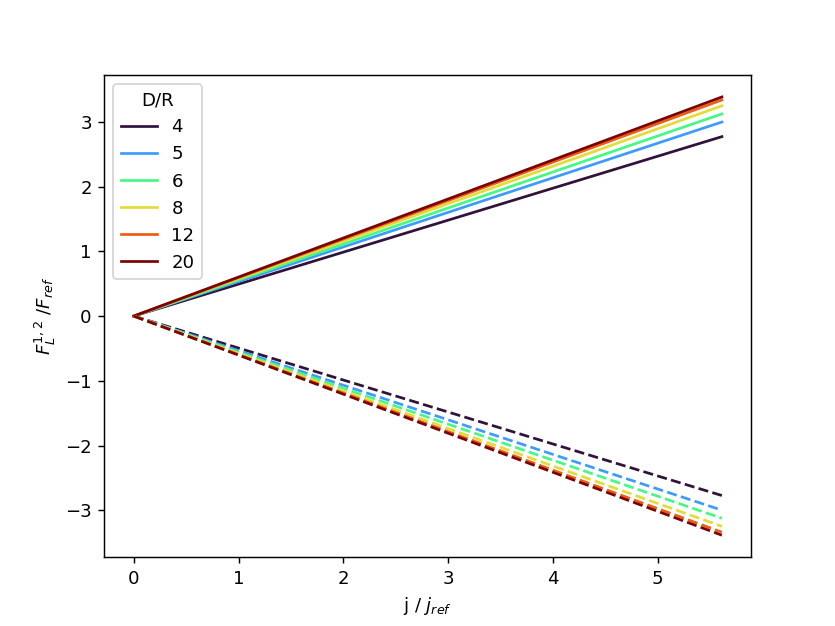

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


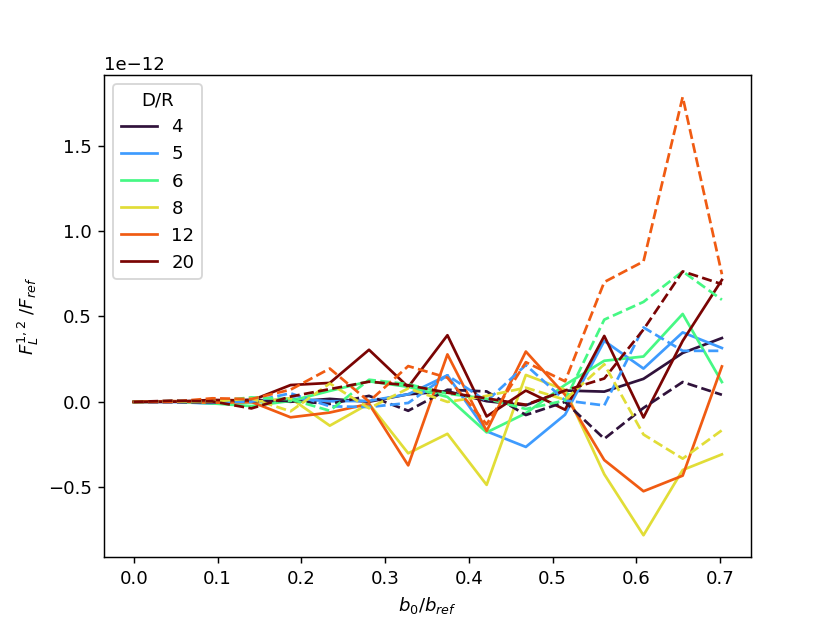

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


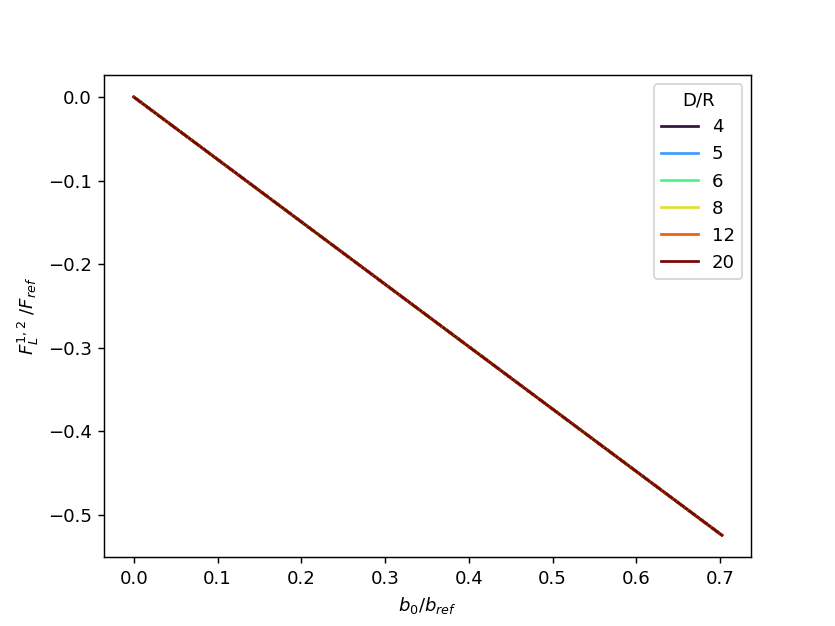

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


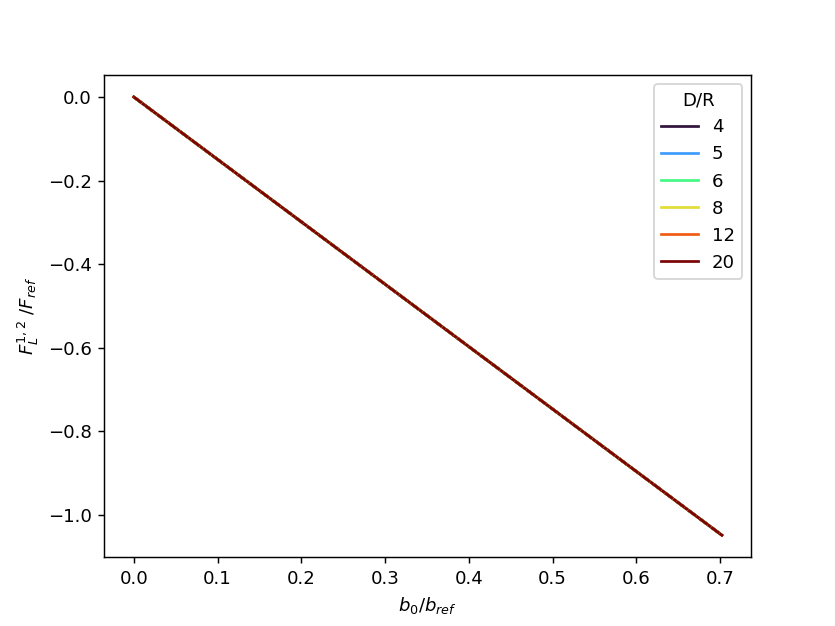

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


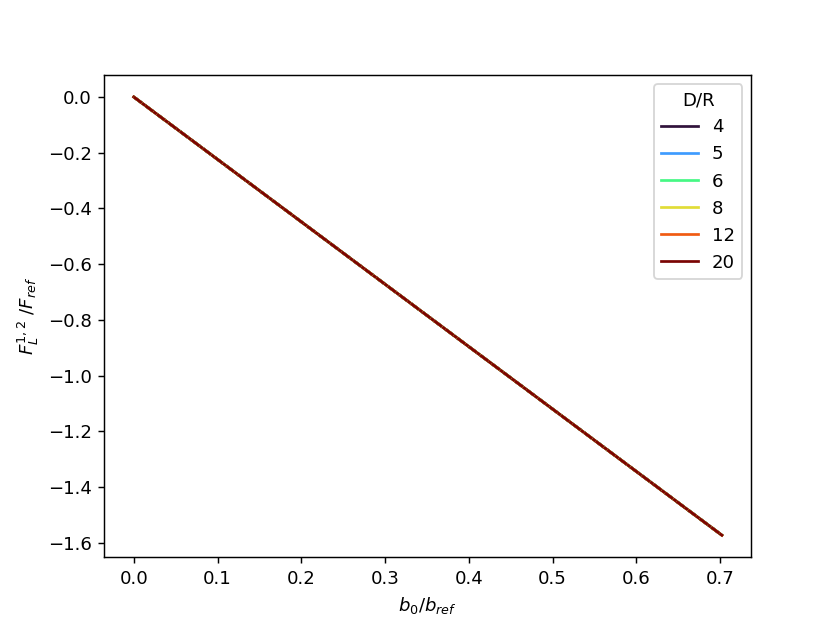

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


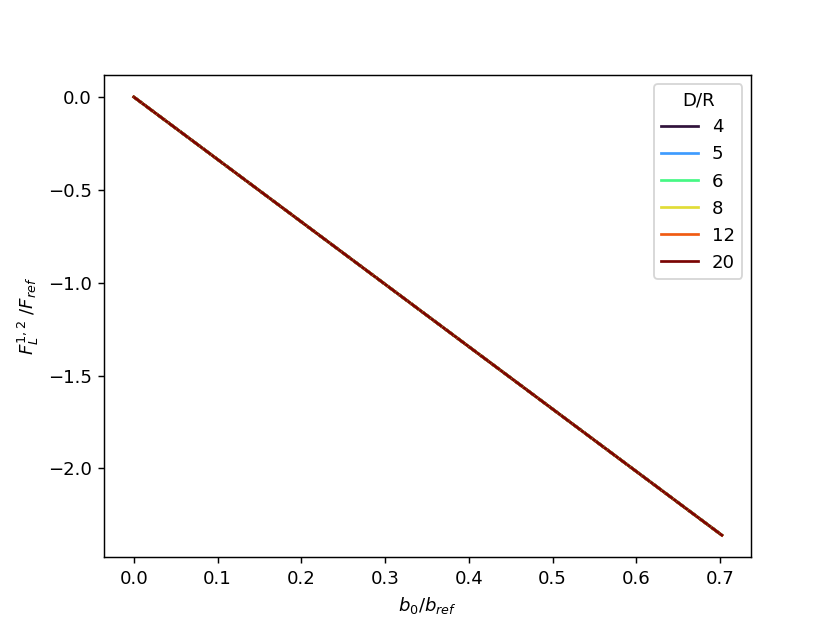

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


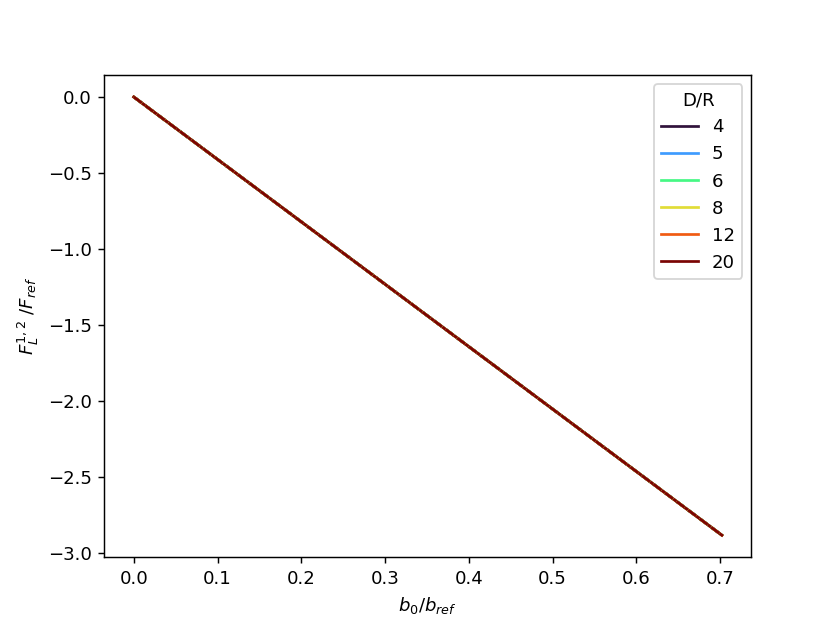

<IPython.core.display.Javascript object>


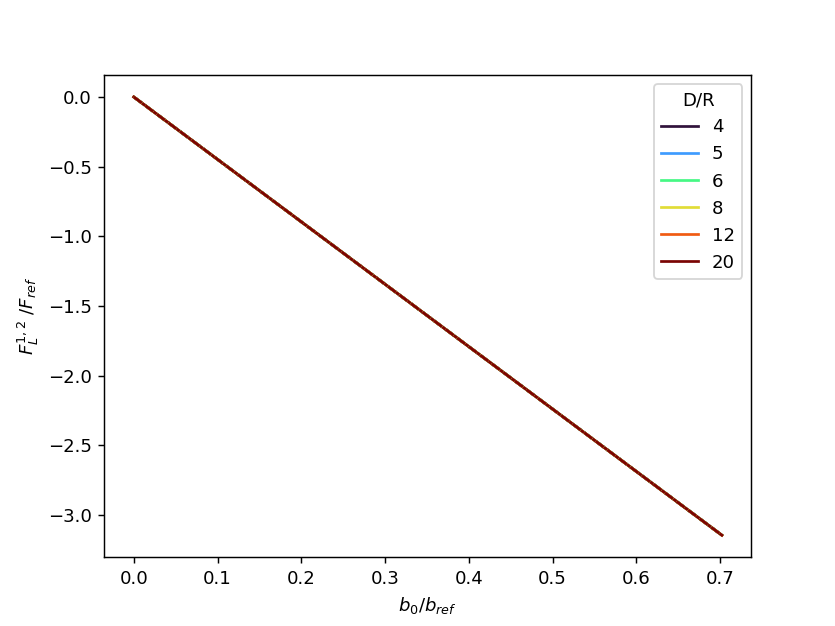

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


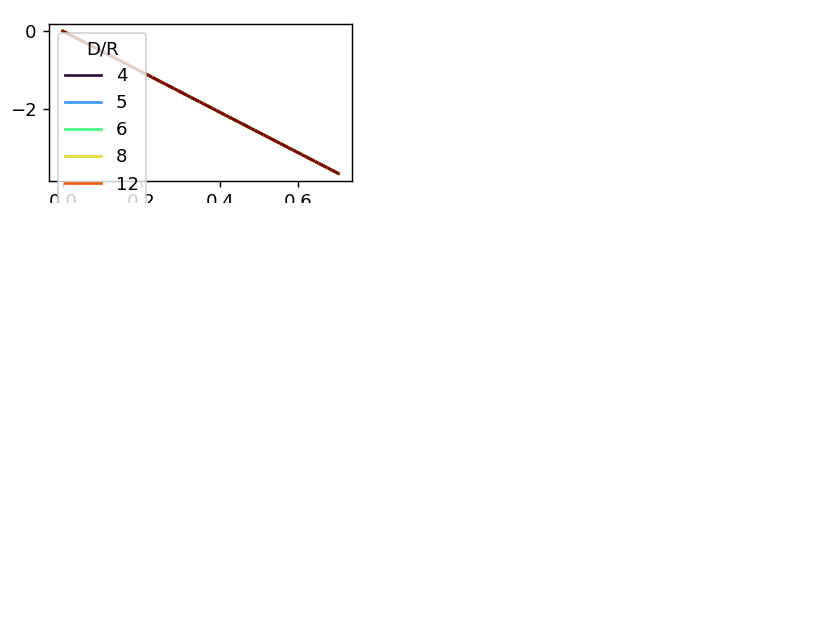

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


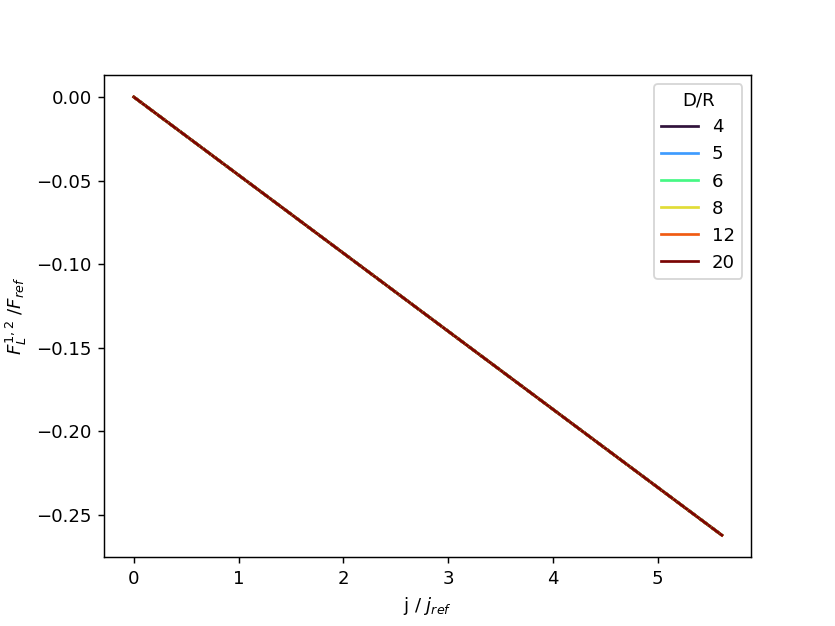

<IPython.core.display.Javascript object>


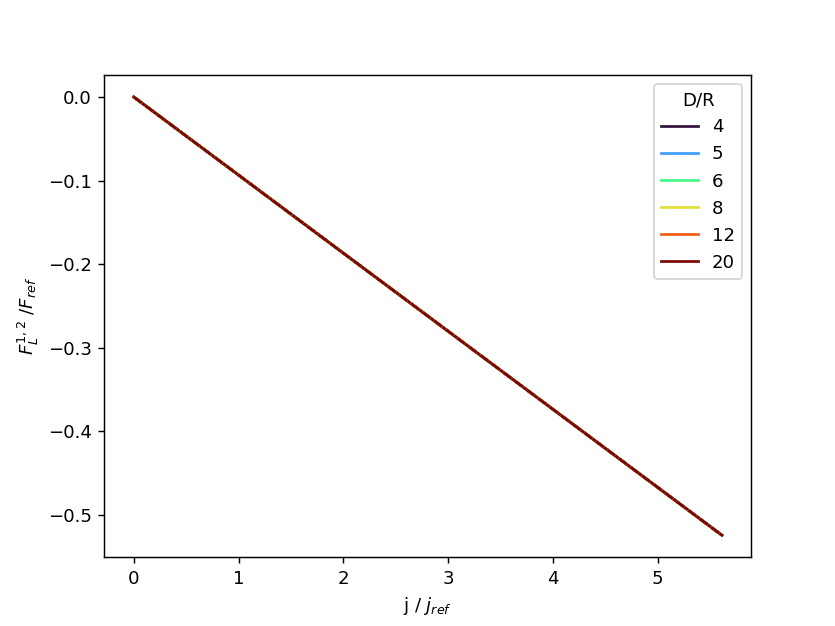

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


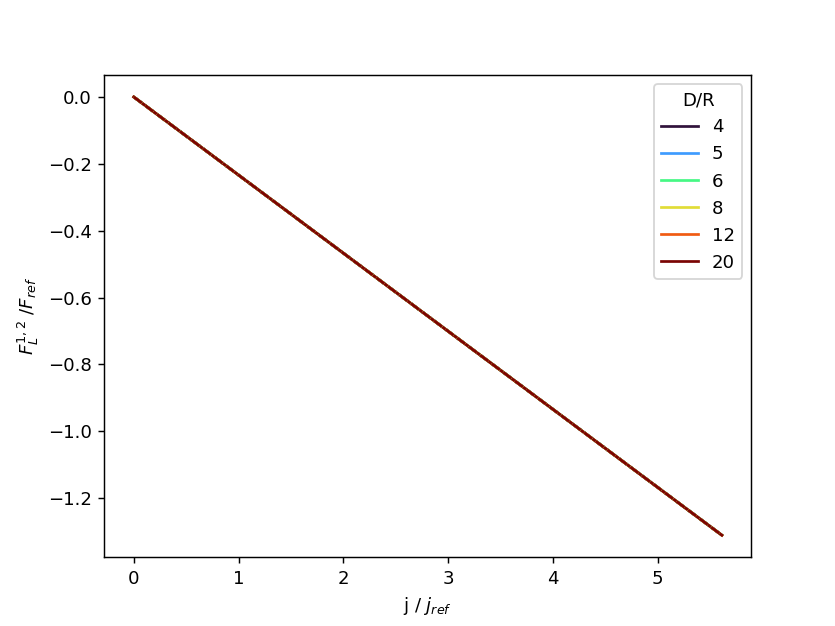

<IPython.core.display.Javascript object>


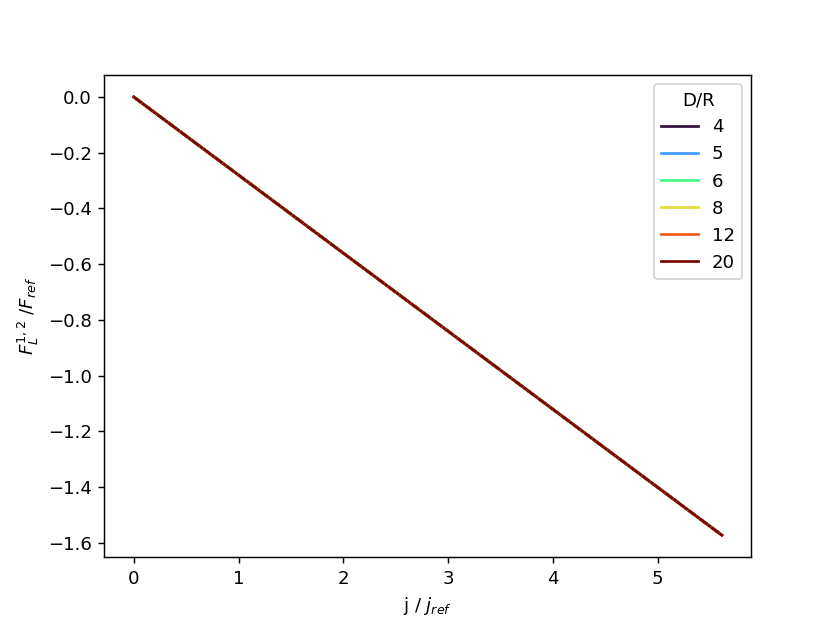

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


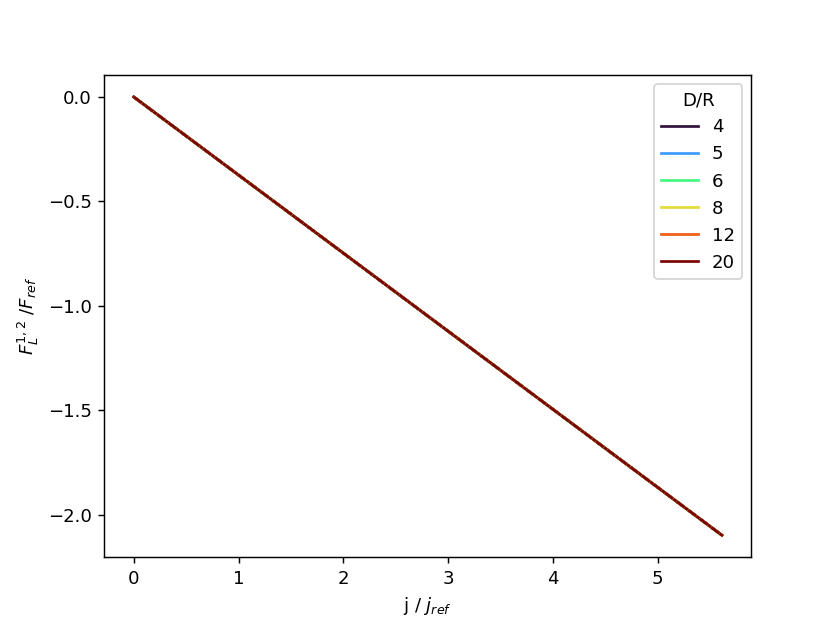

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


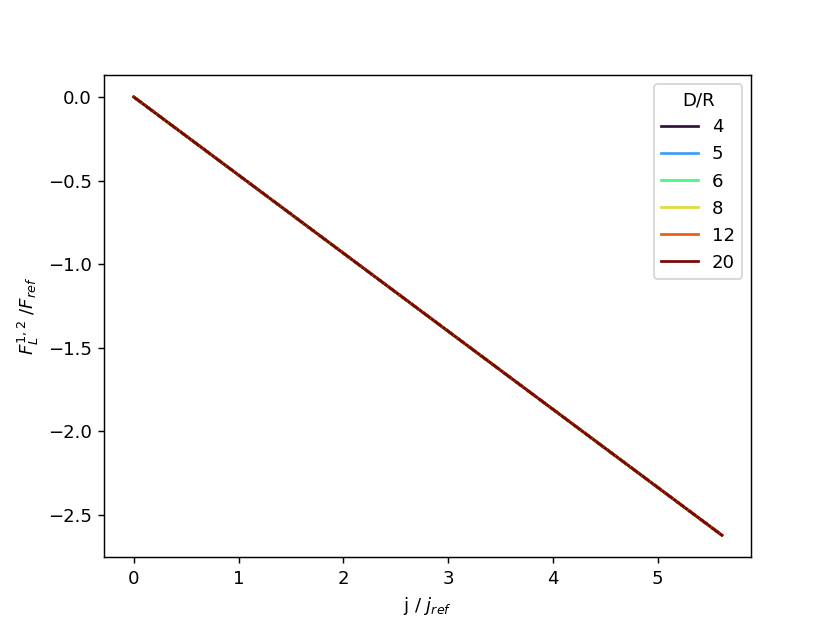

<IPython.core.display.Javascript object>


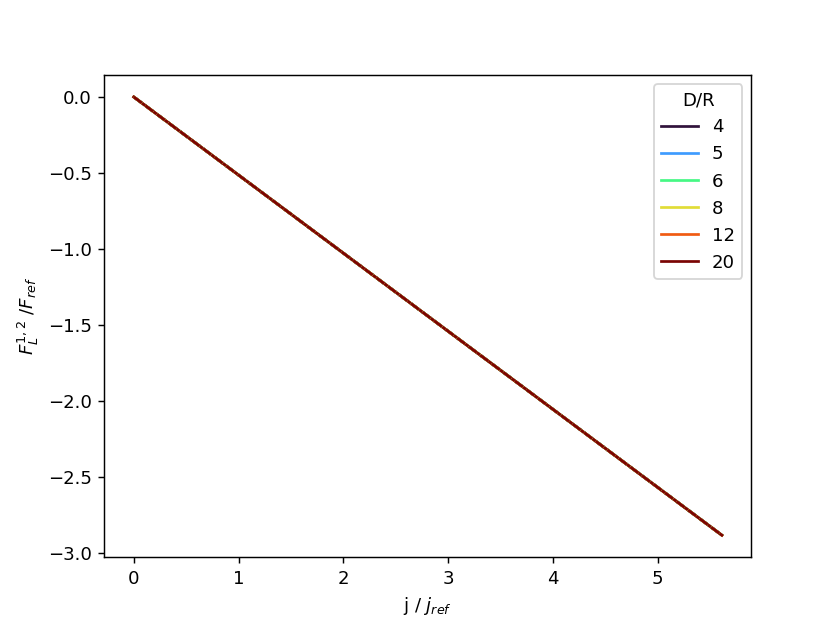

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


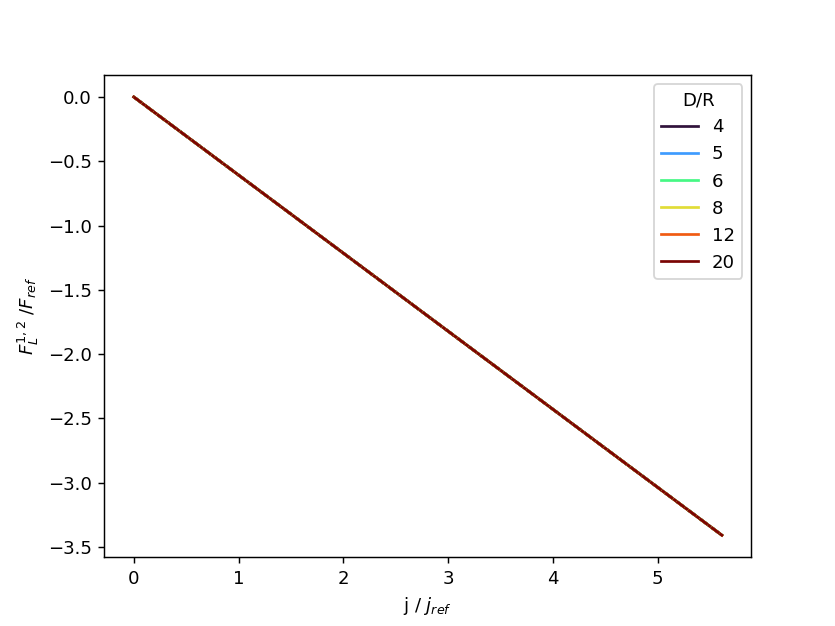

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


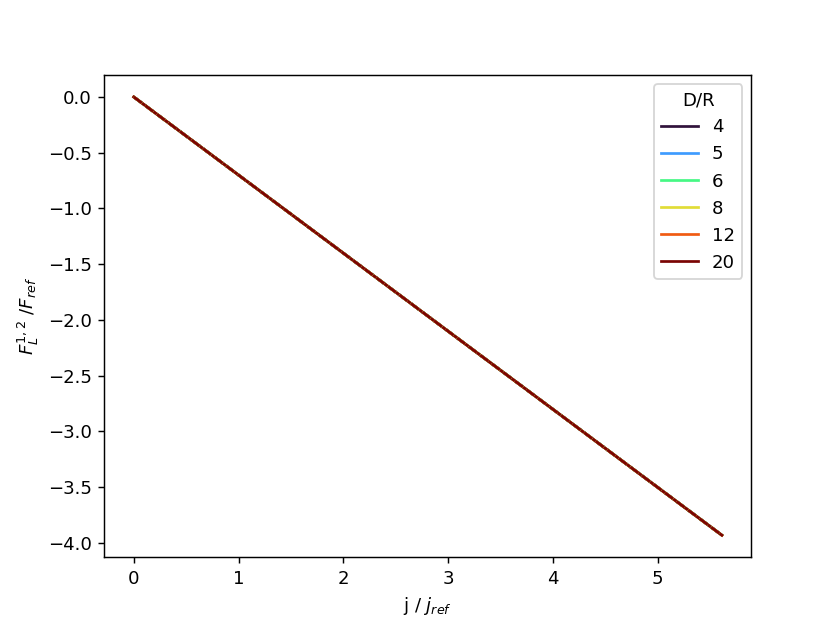

In [7]:
current_density_list=[0,169630,339259,508889,678518,848148,1017780,1187410,1357040,1526670,1696300,1865930,2035550,2205180,2374810,2544440]
b0_list=[0,0.1,0.2,0.30,0.4,0.5,0.6,0.7,0.8,0.9,1.,1.1,1.2,1.3,1.4,1.5]


data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_2wires_para.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/slice/2 wires with para current/'
plot_slices(data1redux,outputpath,current_density_list,b0_list,0)

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_2wires_alter.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/slice/2 wires with opposite current/'
plot_slices(data1redux,outputpath,current_density_list,b0_list,0)

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_perio_alter.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/slice/periodic wires with opposite current/'
plot_slices(data1redux,outputpath,current_density_list,b0_list,0)

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_perio_para.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/slice/periodic wires with para current/'
plot_slices(data1redux,outputpath,current_density_list,b0_list,0)



<IPython.core.display.Javascript object>


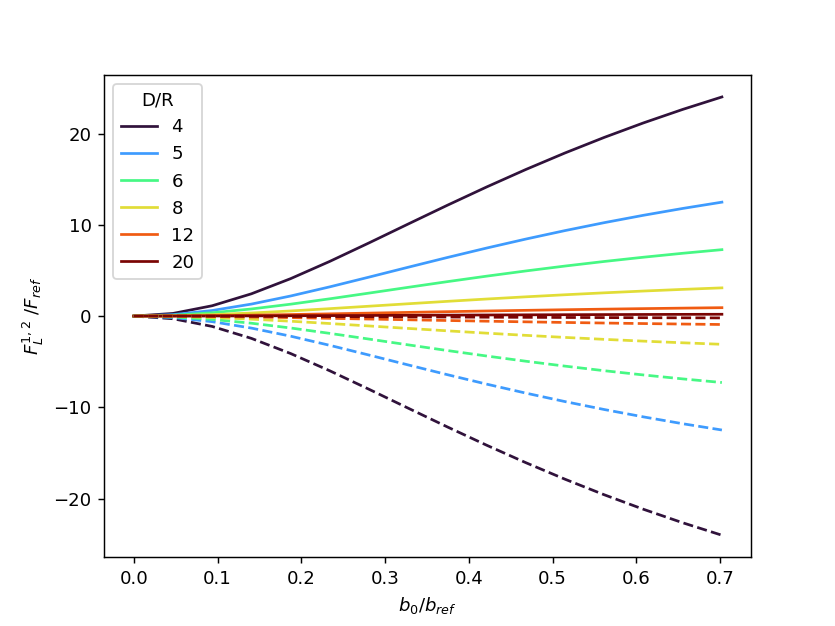

<IPython.core.display.Javascript object>


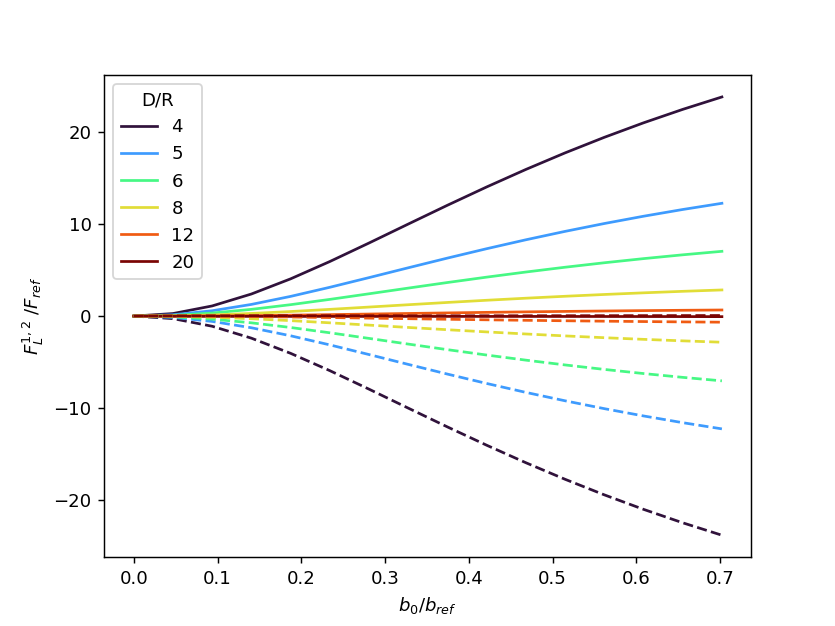

<IPython.core.display.Javascript object>


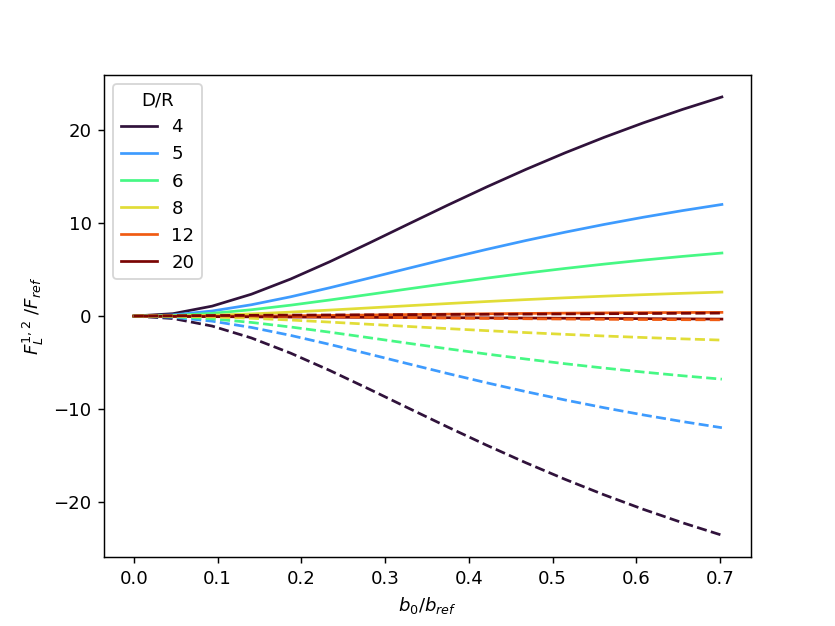

<IPython.core.display.Javascript object>


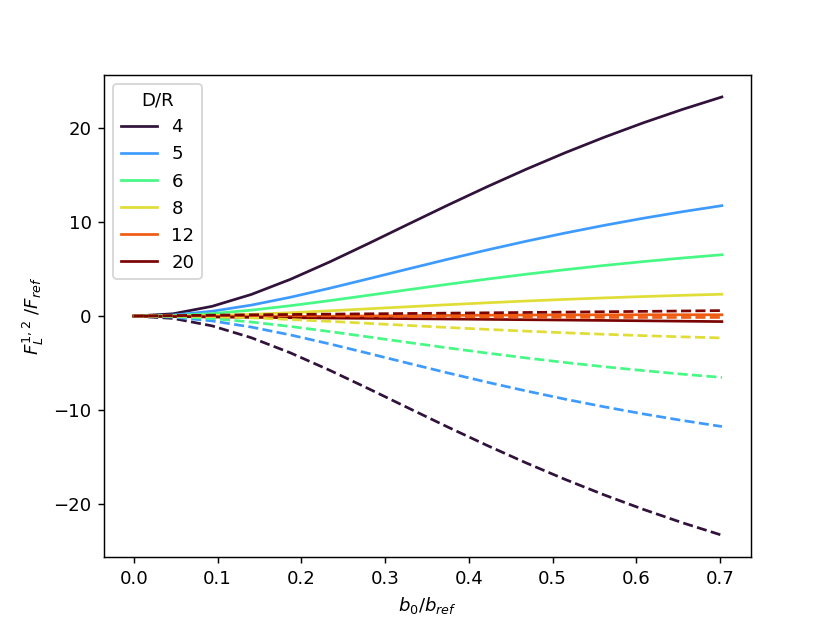

<IPython.core.display.Javascript object>


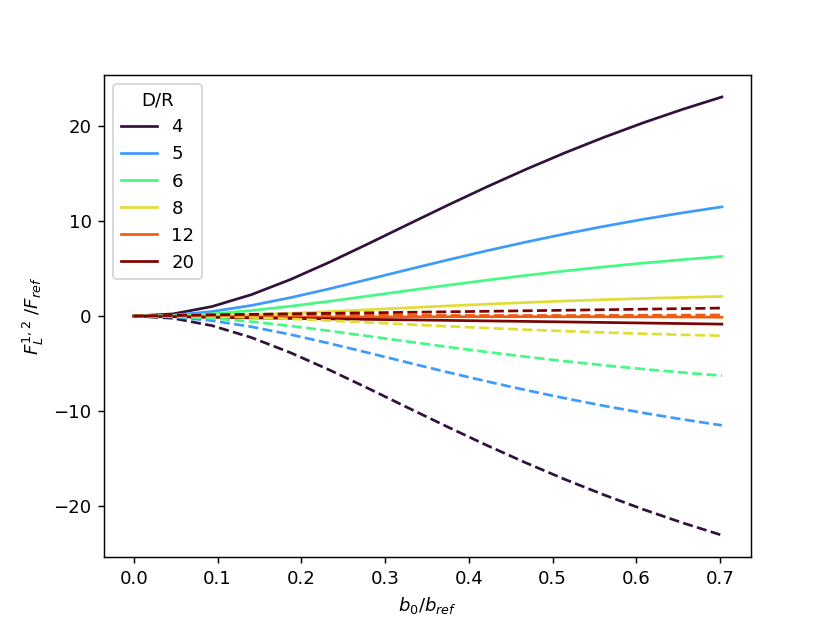

<IPython.core.display.Javascript object>


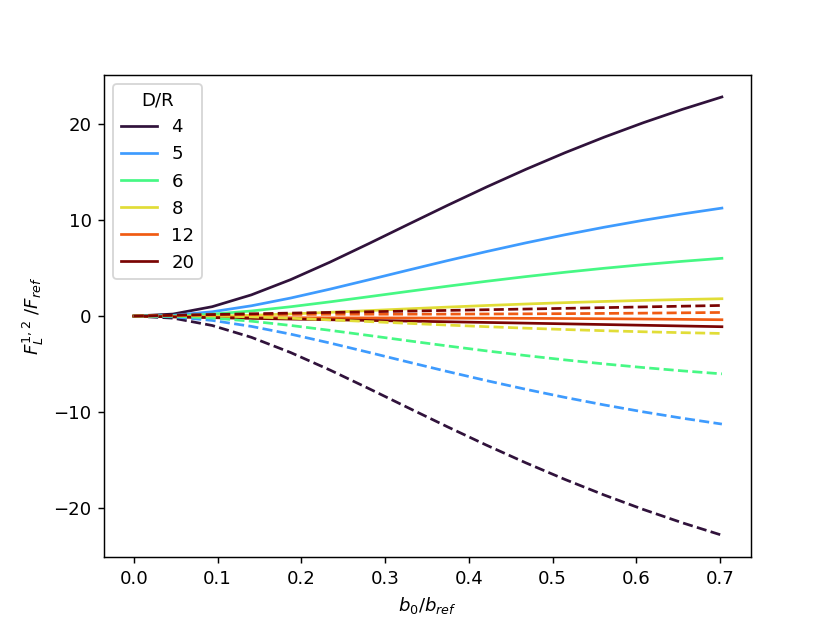

<IPython.core.display.Javascript object>


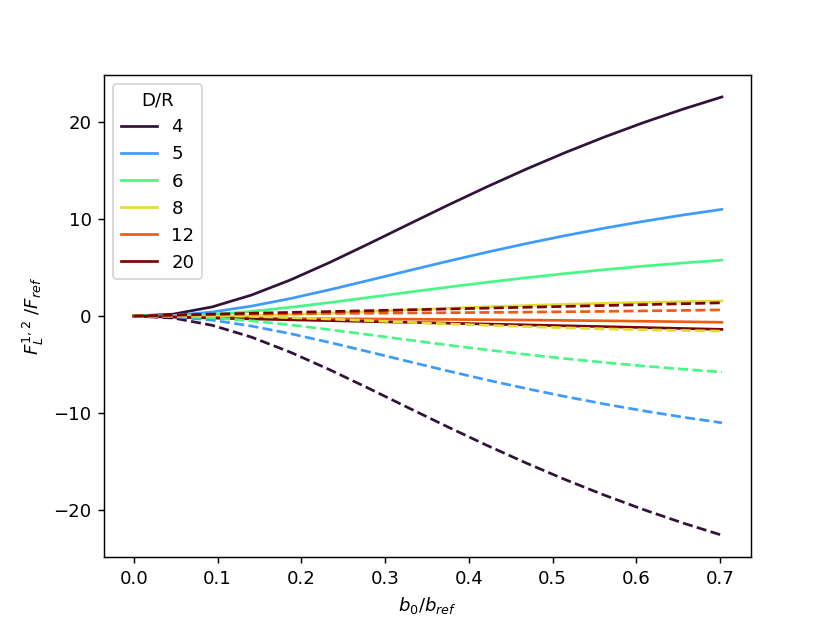

<IPython.core.display.Javascript object>


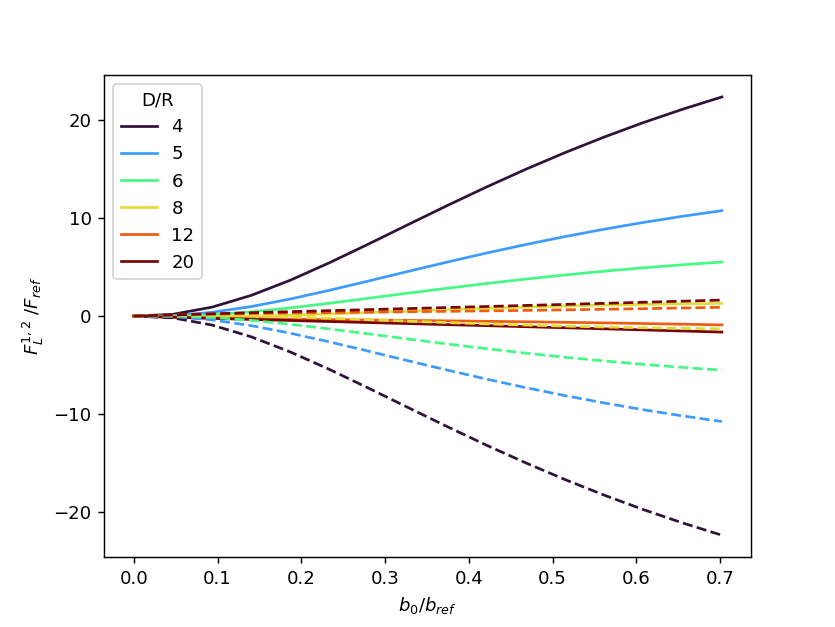

<IPython.core.display.Javascript object>


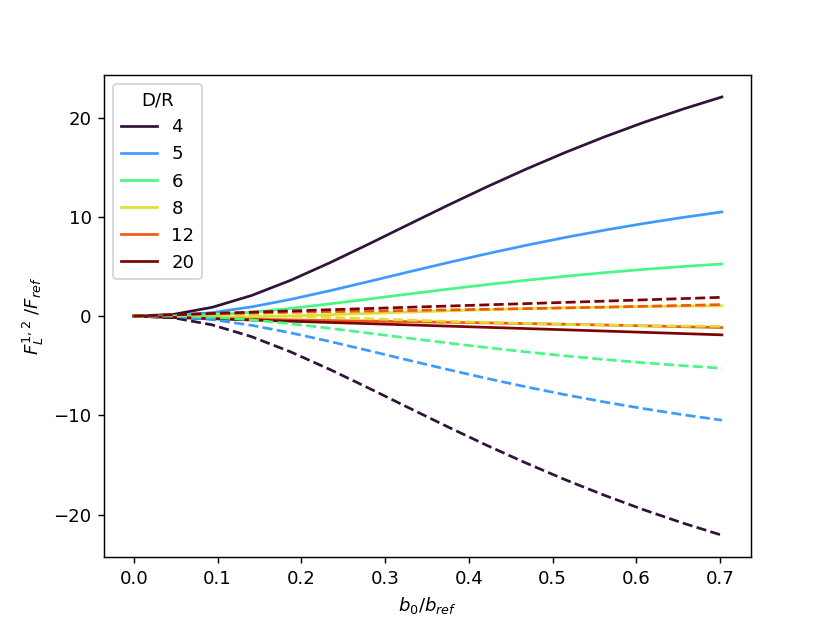

<IPython.core.display.Javascript object>


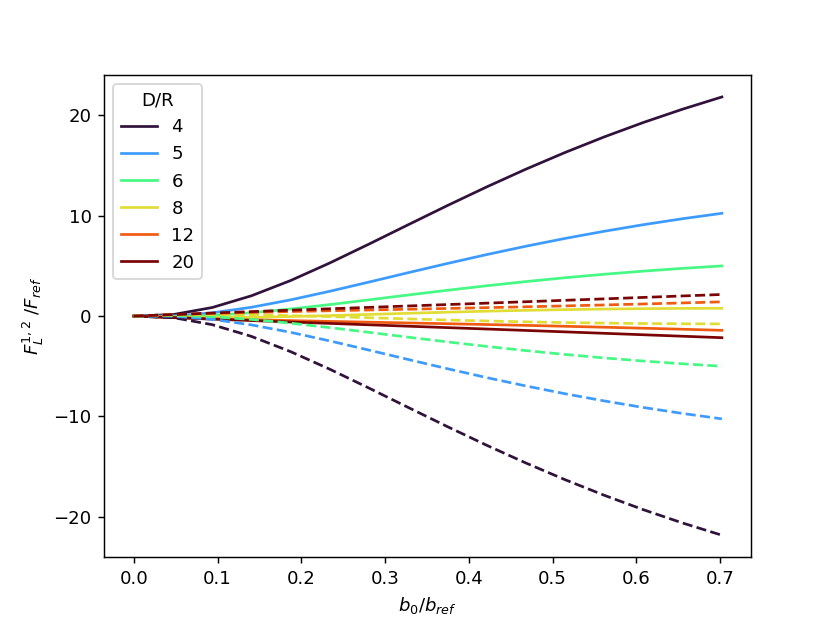

<IPython.core.display.Javascript object>


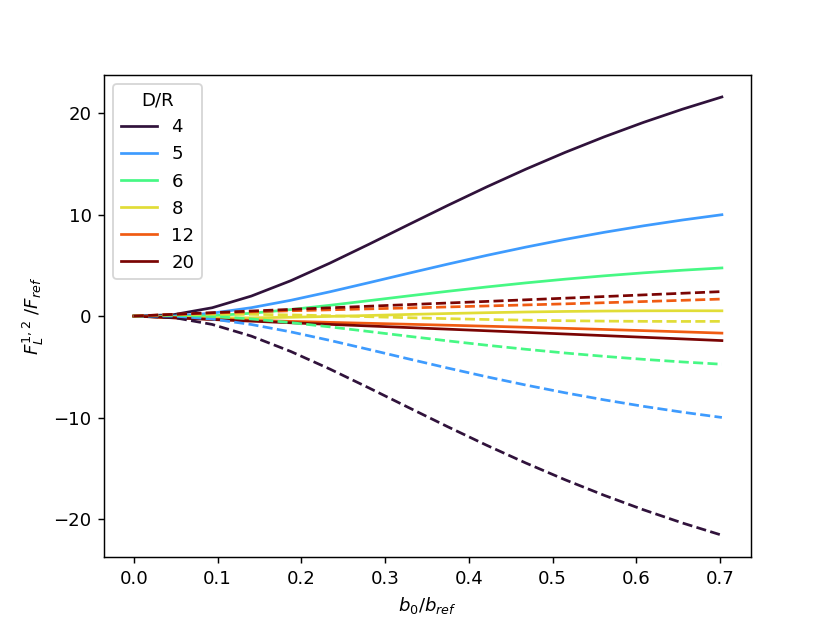

<IPython.core.display.Javascript object>


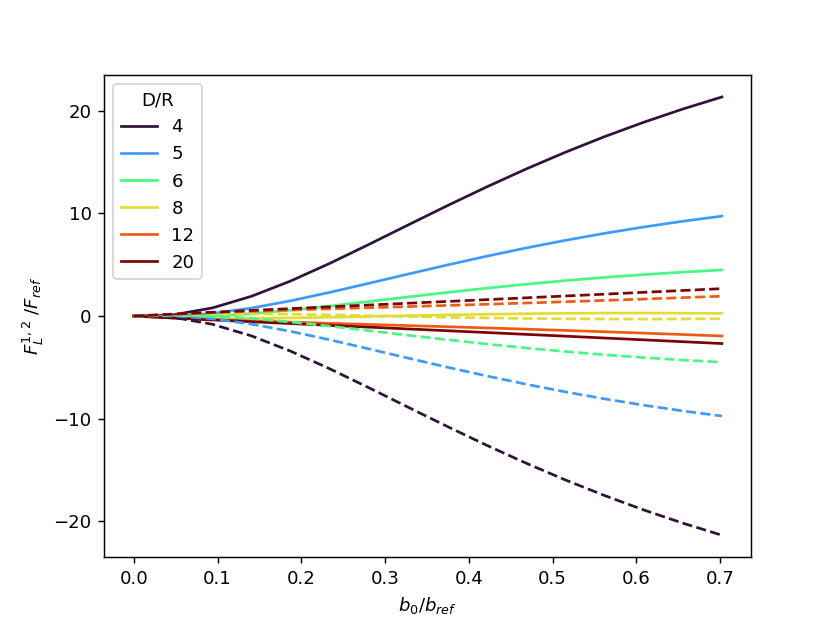

<IPython.core.display.Javascript object>


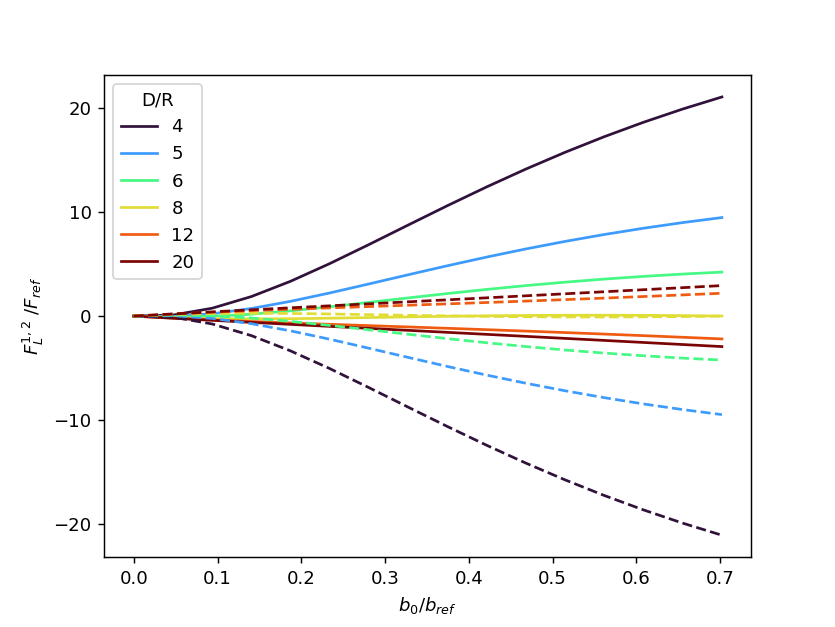

<IPython.core.display.Javascript object>


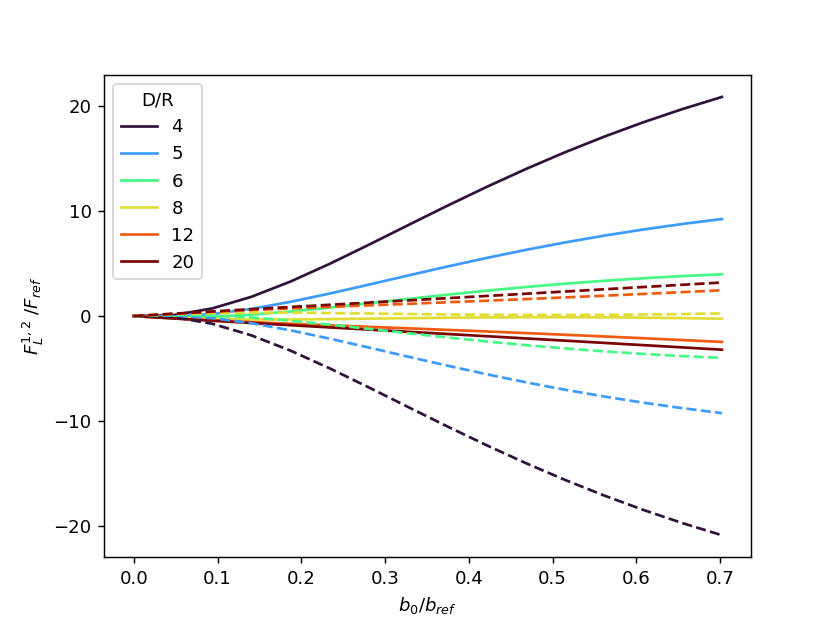

<IPython.core.display.Javascript object>


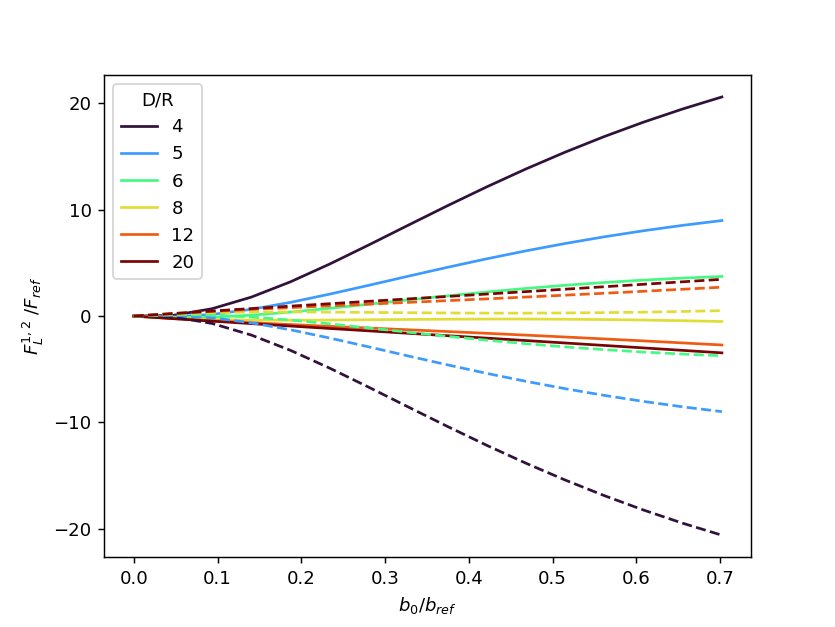

<IPython.core.display.Javascript object>


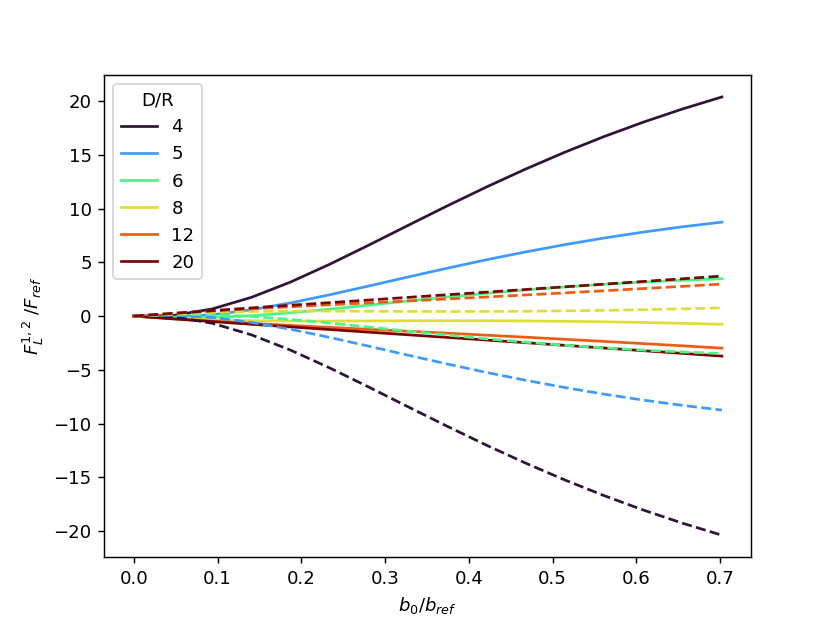

<IPython.core.display.Javascript object>


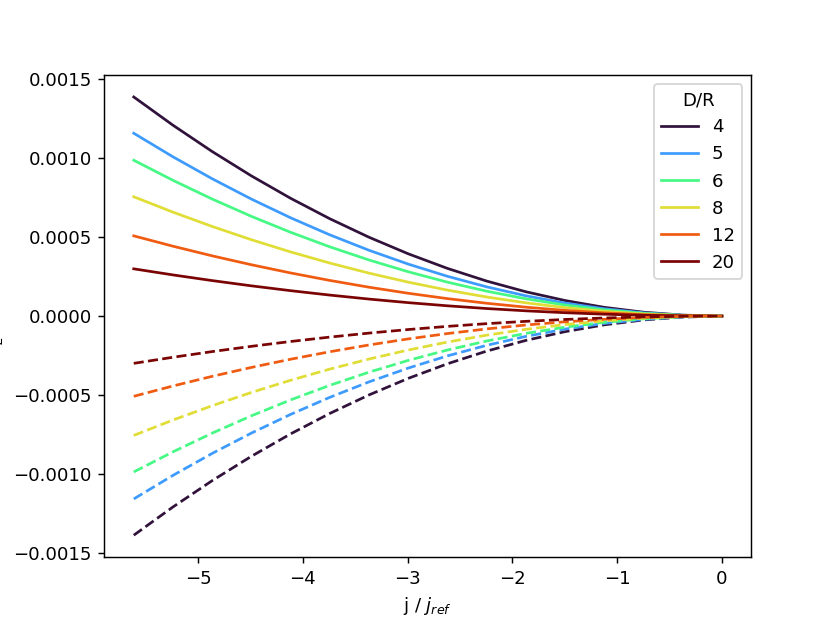

<IPython.core.display.Javascript object>


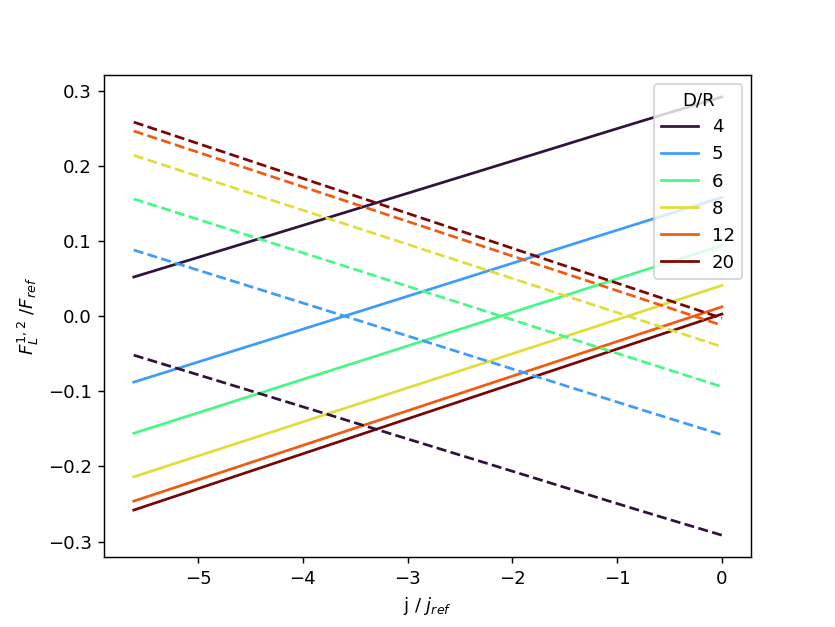

<IPython.core.display.Javascript object>


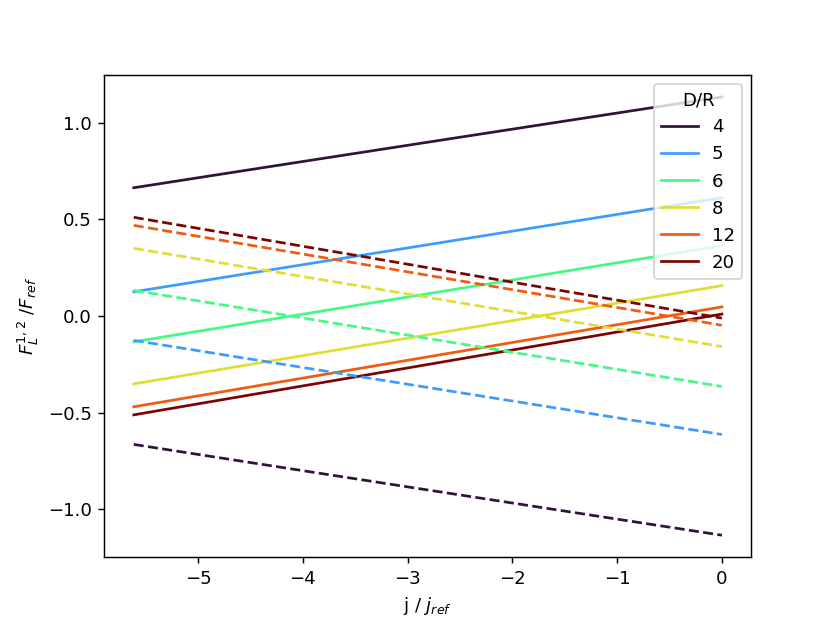

<IPython.core.display.Javascript object>


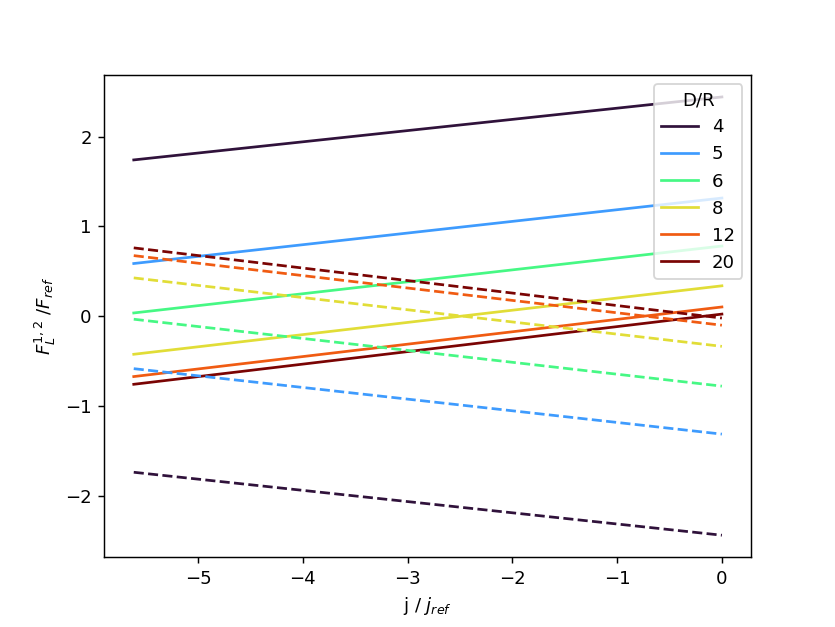

<IPython.core.display.Javascript object>


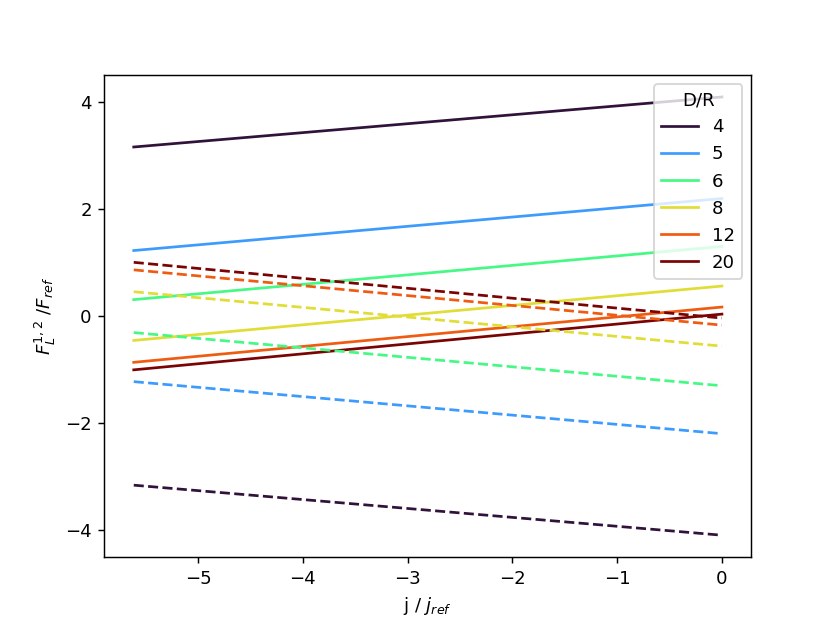

<IPython.core.display.Javascript object>


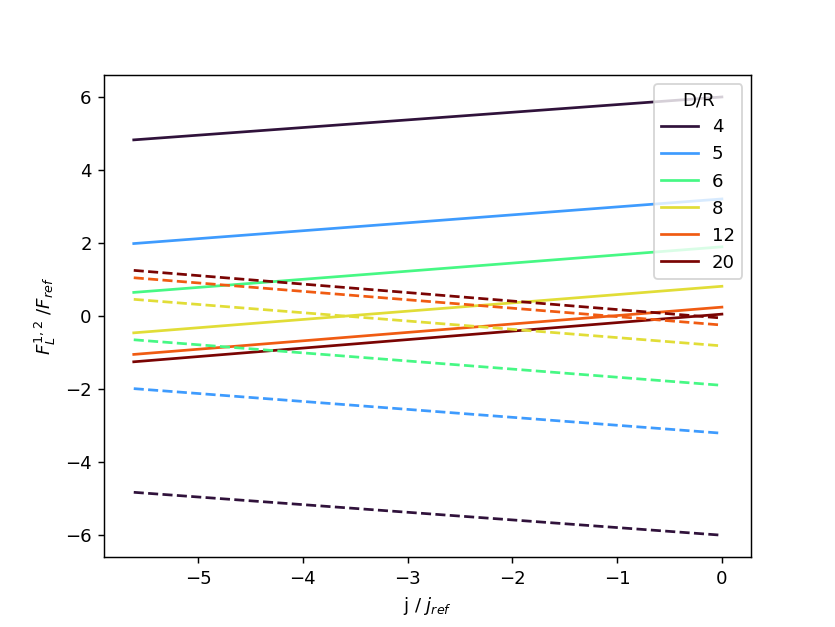

<IPython.core.display.Javascript object>


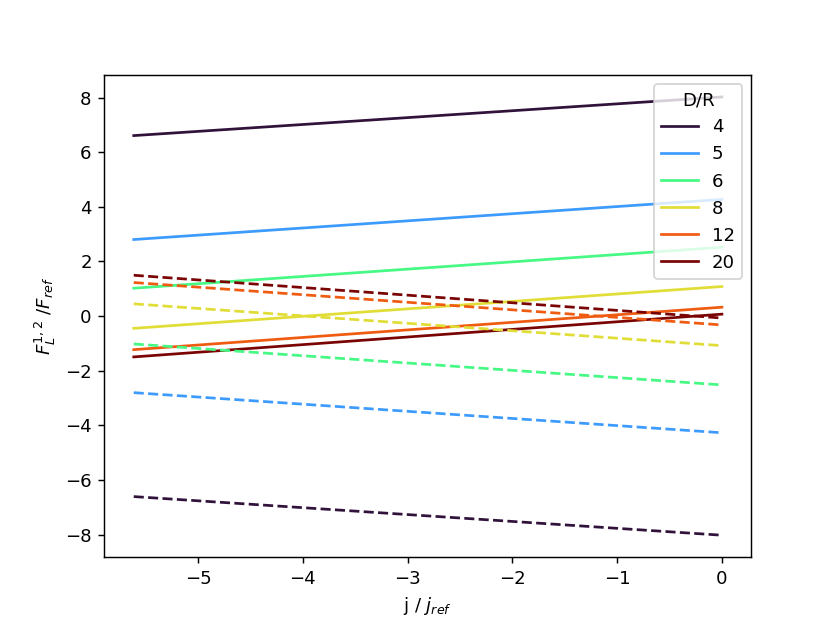

<IPython.core.display.Javascript object>


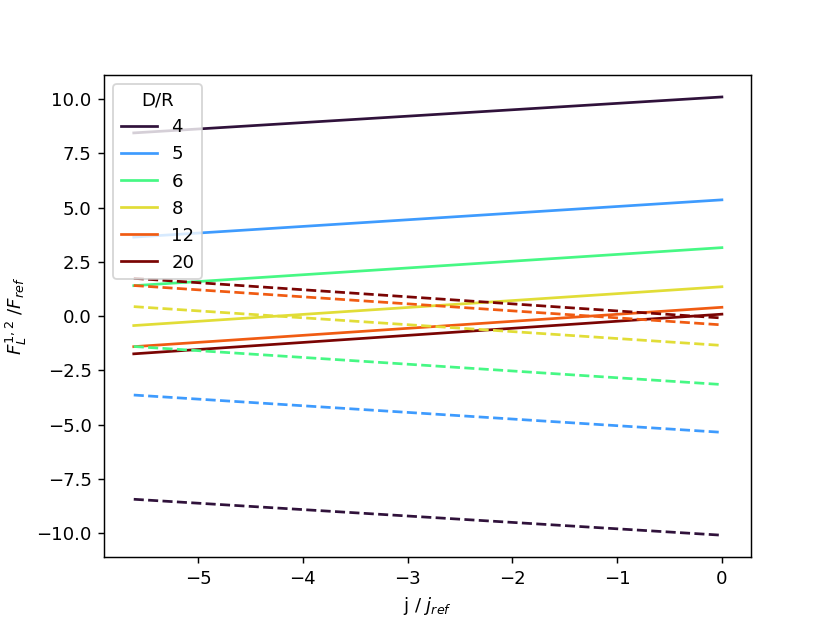

<IPython.core.display.Javascript object>


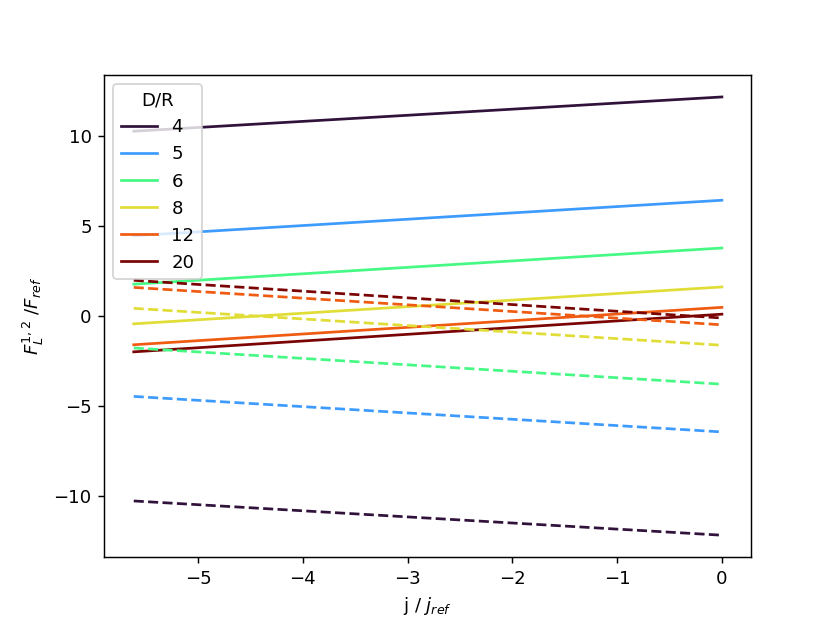

<IPython.core.display.Javascript object>


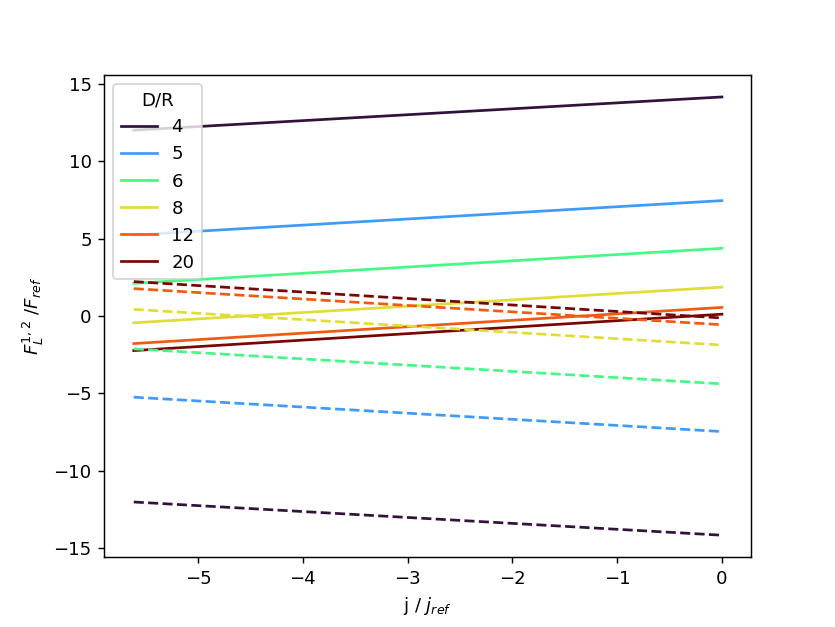

<IPython.core.display.Javascript object>


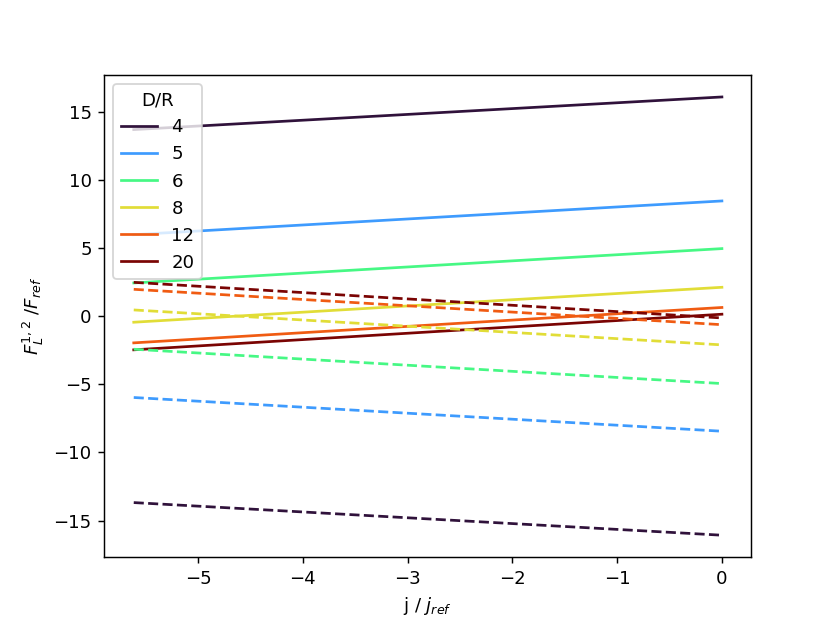

<IPython.core.display.Javascript object>


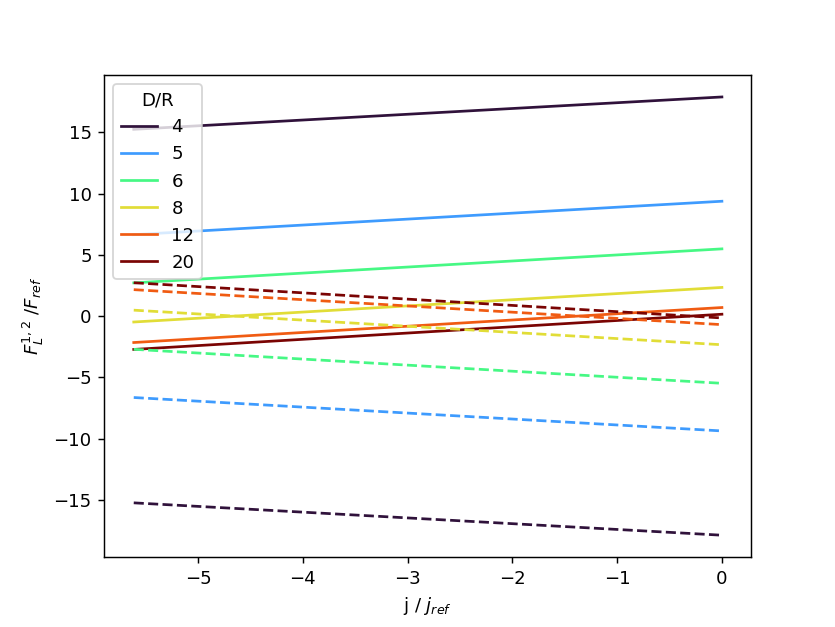

<IPython.core.display.Javascript object>


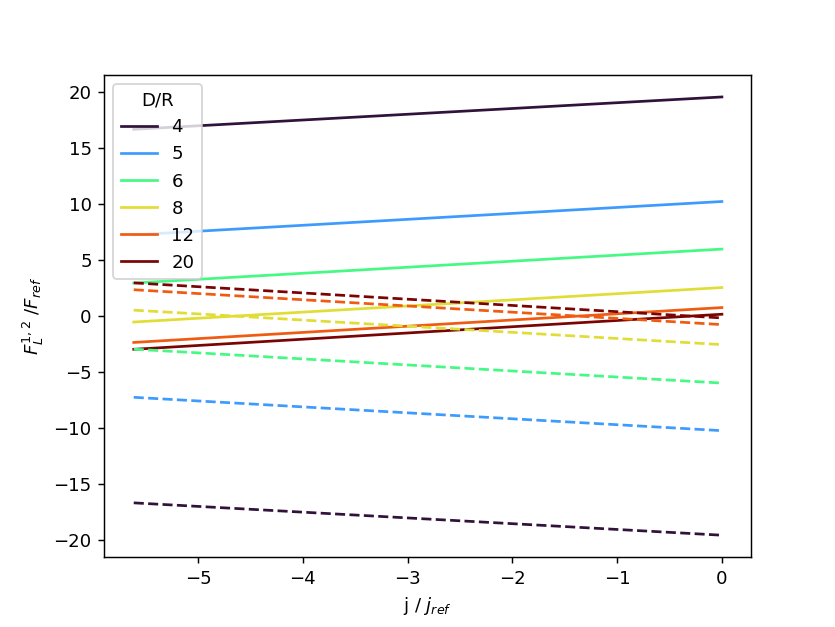

<IPython.core.display.Javascript object>


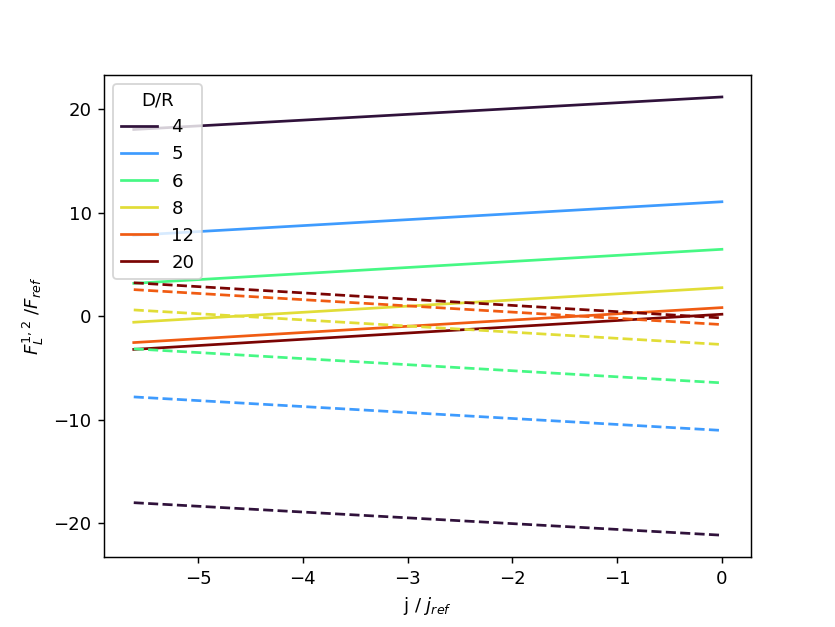

<IPython.core.display.Javascript object>


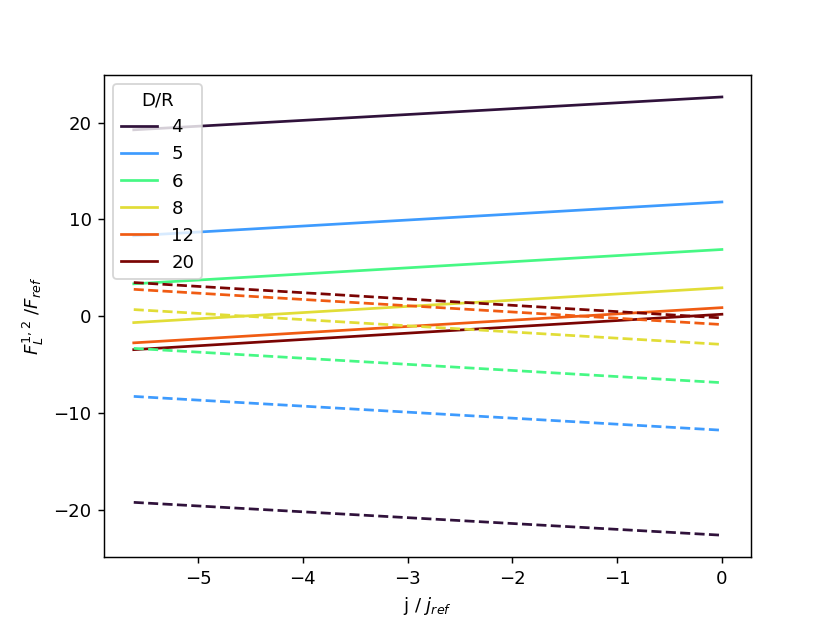

<IPython.core.display.Javascript object>


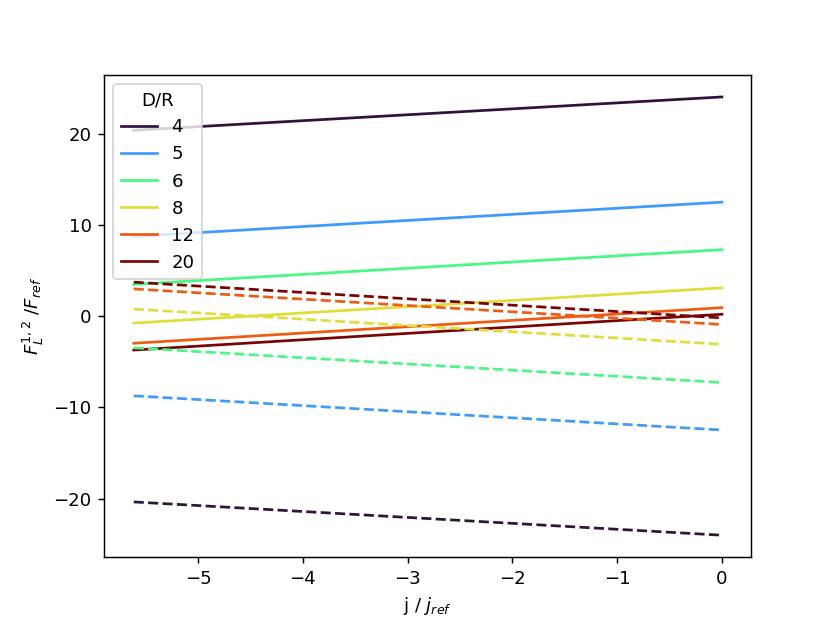

In [9]:
current_density_list=[0,-169630,-339259,-508889,-678518,-848148,-1017780,-1187410,-1357040,-1526670,-1696300,-1865930,-2035550,-2205180,-2374810,-2544440]
b0_list=[0,0.1,0.2,0.30,0.4,0.5,0.6,0.7,0.8,0.9,1.,1.1,1.2,1.3,1.4,1.5]

data1=pd.read_csv('/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/results_2wires_alter_bis.csv')
data1redux=data1.drop(['fx','is_saturated','fy',' fx_r','fyv2','flaplacex','flaplacey','elapse_time_total','fyv2_safe','fy_safe','fy_r','fy_safe_r','flaplacex_r','shapefunction_degree','refinment','fxv2','fxv2_safe','number dof','flaplacey_r','fx_safe','fx_safe_r'],axis=1)
outputpath='/home/magda/Documents/GitHub/thesis-redux/non linear wire b  para/results_4_larger/figs/slice/2 wires with opposite current bis/'
plot_slices(data1redux,outputpath,current_density_list,b0_list,0)